<a href="https://colab.research.google.com/github/mintyougurt/RUL-prediction-of-offshore-wind-turbine/blob/main/LightGBM_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Part1.0: Data loading**

In [ ]:
#import libraries
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
import datetime
import pandas as pd
import seaborn as sns
from sklearn.ensemble import IsolationForest
import statsmodels as sm
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib
from matplotlib import pyplot as plt
from matplotlib.ticker import MaxNLocator
import torch
import torch.nn as nn
import torch.nn.functional as F
import numpy as np
from sklearn.model_selection import train_test_split
import ast
from sklearn.metrics import accuracy_score
from sklearn import metrics
import torch.utils.data as data

In [ ]:
#define min-max function
def mean_norm(df_input):
    return df_input.apply(lambda x: (x-x.min())/ (x.max()-x.min()), axis=0)

#define loss function
def loss(y_true, y_pred):
    rmse = np.sqrt(metrics.mean_squared_error(y_true, y_pred))
    mae = metrics.mean_absolute_error(y_true, y_pred)
    return rmse+mae

In [ ]:
#import SCADA data and number of events (82 columns)
dfT01 = pd.read_csv(r"/content/dfT01combined.csv", index_col=0)
dfT01

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,count
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,1268.3,93.3,999.7,435.9,41.0,58,59,59,30,44,...,0.0,-501.0,123.7,79.6,501.0,0.0,123.7,37,218.5,0
2016-01-01 00:20:00,1394.4,220.3,774.0,486.1,41.0,57,57,57,30,43,...,0.0,-1000.0,357.4,314.0,1000.0,0.0,357.4,37,213.3,2
2016-01-01 00:30:00,1306.6,1212.4,1257.1,17.0,40.0,56,57,57,30,44,...,0.0,-1000.0,245.8,654.0,1000.0,0.0,245.8,36,222.4,0
2016-01-01 00:40:00,1320.9,1224.1,1257.7,18.0,40.0,57,58,57,30,44,...,0.0,-1000.0,302.7,496.1,1000.0,0.0,302.7,36,222.4,0
2016-01-01 00:50:00,1462.6,1249.5,1328.5,48.3,40.0,58,59,58,30,45,...,-714.7,-1000.0,27.4,996.0,1000.0,714.7,27.4,36,221.3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,1677.7,0.0,185.8,449.2,34.0,35,35,35,36,50,...,0.0,-1000.0,239.0,59.5,1000.0,0.0,223.7,31,127.4,5
2016-07-18 01:50:00,1759.3,1627.6,1673.6,19.8,34.0,55,50,47,36,52,...,-583.3,-1000.0,166.0,494.2,890.4,406.1,112.6,33,127.3,4
2016-07-18 02:00:00,1756.8,1621.8,1681.0,20.0,37.0,73,66,62,37,56,...,-583.3,-1000.0,71.0,417.8,820.8,406.1,48.2,41,118.6,1


In [ ]:
#delete empty features
del dfT01["Prod_LatestAvg_ActPwrGen2"]
del dfT01["Prod_LatestAvg_ReactPwrGen2"]

In [ ]:
# Identify constant columns
constant_cols = dfT01.columns[dfT01.nunique() == 1]
constant_cols

Index([], dtype='object')

In [ ]:
#copy panda dataframe
df2=dfT01
df2

,Gen_RPM_Max,Gen_RPM_Min,Gen_RPM_Avg,Gen_RPM_Std,Gen_Bear_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase3_Temp_Avg,Hyd_Oil_Temp_Avg,Gear_Oil_Temp_Avg,...,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Std,Grd_Prod_PsbleCap_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleCap_Std,Gen_Bear2_Temp_Avg,Nac_Direction_Avg,count
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,1268.3,93.3,999.7,435.9,41.0,58,59,59,30,44,...,0.0,-501.0,123.7,79.6,501.0,0.0,123.7,37,218.5,0
2016-01-01 00:20:00,1394.4,220.3,774.0,486.1,41.0,57,57,57,30,43,...,0.0,-1000.0,357.4,314.0,1000.0,0.0,357.4,37,213.3,2
2016-01-01 00:30:00,1306.6,1212.4,1257.1,17.0,40.0,56,57,57,30,44,...,0.0,-1000.0,245.8,654.0,1000.0,0.0,245.8,36,222.4,0
2016-01-01 00:40:00,1320.9,1224.1,1257.7,18.0,40.0,57,58,57,30,44,...,0.0,-1000.0,302.7,496.1,1000.0,0.0,302.7,36,222.4,0
2016-01-01 00:50:00,1462.6,1249.5,1328.5,48.3,40.0,58,59,58,30,45,...,-714.7,-1000.0,27.4,996.0,1000.0,714.7,27.4,36,221.3,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,1677.7,0.0,185.8,449.2,34.0,35,35,35,36,50,...,0.0,-1000.0,239.0,59.5,1000.0,0.0,223.7,31,127.4,5
2016-07-18 01:50:00,1759.3,1627.6,1673.6,19.8,34.0,55,50,47,36,52,...,-583.3,-1000.0,166.0,494.2,890.4,406.1,112.6,33,127.3,4
2016-07-18 02:00:00,1756.8,1621.8,1681.0,20.0,37.0,73,66,62,37,56,...,-583.3,-1000.0,71.0,417.8,820.8,406.1,48.2,41,118.6,1


In [ ]:
#Find temperatures
strings=list(df2.columns)
temp_strings = []
for string in strings:
  if "Temp" in string:#string.lower():
    temp_strings.append(string)

print(temp_strings)
print(len(temp_strings))

['Gen_Bear_Temp_Avg', 'Gen_Phase1_Temp_Avg', 'Gen_Phase2_Temp_Avg', 'Gen_Phase3_Temp_Avg', 'Hyd_Oil_Temp_Avg', 'Gear_Oil_Temp_Avg', 'Gear_Bear_Temp_Avg', 'Nac_Temp_Avg', 'Amb_Temp_Avg', 'HVTrafo_Phase1_Temp_Avg', 'HVTrafo_Phase2_Temp_Avg', 'HVTrafo_Phase3_Temp_Avg', 'Grd_InverterPhase1_Temp_Avg', 'Cont_Top_Temp_Avg', 'Cont_Hub_Temp_Avg', 'Cont_VCP_Temp_Avg', 'Gen_SlipRing_Temp_Avg', 'Spin_Temp_Avg', 'Cont_VCP_ChokcoilTemp_Avg', 'Grd_RtrInvPhase1_Temp_Avg', 'Grd_RtrInvPhase2_Temp_Avg', 'Grd_RtrInvPhase3_Temp_Avg', 'Cont_VCP_WtrTemp_Avg', 'Grd_Busbar_Temp_Avg', 'Gen_Bear2_Temp_Avg']
25


In [ ]:
#delete environment temperature
temp_strings2 =['Gen_Bear_Temp_Avg',
 'Hyd_Oil_Temp_Avg',
 'Gear_Oil_Temp_Avg',
 'Gear_Bear_Temp_Avg',
 'Gen_SlipRing_Temp_Avg',
 'Spin_Temp_Avg',
 'Cont_VCP_ChokcoilTemp_Avg',
 'Grd_Busbar_Temp_Avg',
 'Gen_Bear2_Temp_Avg']

In [ ]:
#set temps as target
dftemp= df2[temp_strings2] #target variable Y
dfa = df2.drop(temp_strings2, axis=1).copy() #other non-temp varibles X

#min-max to (0,1)
dfa=mean_norm(dfa)
dfa_y=mean_norm(dftemp)

print(len(dfa.columns))
print(len(dfa_y.columns))

71
9


In [ ]:
y1=dfa_y['Gear_Oil_Temp_Avg']
y2=dfa_y['Gear_Bear_Temp_Avg']
y3=dfa_y['Gen_Bear_Temp_Avg']
y4=dfa_y['Hyd_Oil_Temp_Avg']
y5=dfa_y['Cont_VCP_ChokcoilTemp_Avg']
y6=dfa_y['Grd_Busbar_Temp_Avg']
y7=dfa_y['Gen_Bear2_Temp_Avg']
y8=dfa_y['Spin_Temp_Avg']
y9=dfa_y['Gen_SlipRing_Temp_Avg']

In [ ]:
#split data
train, test = train_test_split(dfa, test_size=0.4,shuffle=False)
print(train.shape)
print(test.shape)

(17179, 71)
(11454, 71)


In [ ]:

target1=np.reshape(y1.values,(len(dfa),))
target2=np.reshape(y2.values,(len(dfa),))
target3=np.reshape(y3.values,(len(dfa),))
target4=np.reshape(y4.values,(len(dfa),))
target5=np.reshape(y5.values,(len(dfa),))
target6=np.reshape(y6.values,(len(dfa),))
target7=np.reshape(y7.values,(len(dfa),))
target8=np.reshape(y8.values,(len(dfa),))
target9=np.reshape(y9.values,(len(dfa),))
a1, b1 = train_test_split(target1, test_size=0.4,shuffle=False)
a2, b2 = train_test_split(target2, test_size=0.4,shuffle=False)
a3, b3 = train_test_split(target3, test_size=0.4,shuffle=False)
a4, b4 = train_test_split(target4, test_size=0.4,shuffle=False)
a5, b5 = train_test_split(target5, test_size=0.4,shuffle=False)
a6, b6 = train_test_split(target6, test_size=0.4,shuffle=False)
a7, b7 = train_test_split(target7, test_size=0.4,shuffle=False)
a8, b8 = train_test_split(target8, test_size=0.4,shuffle=False)
a9, b9 = train_test_split(target9, test_size=0.4,shuffle=False)
print(a1.shape)
print(b1.shape)

(17179,)
(11454,)


In [ ]:
import lightgbm as lgb
from lightgbm import LGBMRegressor
from sklearn.model_selection import KFold, cross_val_score, GridSearchCV
from sklearn.metrics import make_scorer
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import multiprocessing
import matplotlib.cm as cm
#cores = multiprocessing.cpu_count() # Count the number of cores in a computer
#cores

/usr/local/lib/python3.10/dist-packages/dask/dataframe/__init__.py:42: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


# **1 Gear oil temp**

In [ ]:
#k fold validation and grid search
num_folds = 5
seed = 50
np.random.seed(seed)

# Define the parameter grid for grid search
param_grid = {'num_leaves': [2,4,6,8,10,12,14,16,18,20], #maximum tree leaves
    'n_estimators': [100,200,300,400,500,600,700,800,900,1000]} #how many boosted trees

# Create the K-fold cross-validation iterator
kf = KFold(n_splits=num_folds, shuffle=False)
param_columns = ['param_n_estimators', 'param_num_leaves']
score_columns = ['mean_train_score', 'mean_test_score']

def optimizer(input,output):
  regressor = lgb.LGBMRegressor(num_leaves=2,n_estimators=10,random_state=seed)
  scoring = make_scorer(loss, greater_is_better=False)
  train_scores = []
  val_scores = []
  # Perform K-fold cross-validation with grid search
  grid_search = GridSearchCV(regressor, param_grid, cv=kf, scoring=scoring,return_train_score=True,n_jobs=-1) #use 4 core cpu
  grid_search.fit(input, output) # 78 features for gear oil temp.
  results_df = pd.DataFrame(grid_search.cv_results_)
  results_df[score_columns] = np.abs(results_df[score_columns])
  param_scores_df = results_df[param_columns + score_columns]
  param_scores_df.columns=['param_n_estimators', 'param_num_leaves','mean_train_score', 'mean_validation_score']
  return param_scores_df

In [ ]:
param_scores_df=optimizer(train,a1)
print(param_scores_df)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.094625   
1                 100                4          0.081241   
2                 100                6          0.074872   
3                 100                8          0.070584   
4                 100               10          0.067084   
..                ...              ...               ...   
95               1000               12          0.032964   
96               1000               14          0.029680   
97               1000               16          0.027008   
98               1000               18          0.024526   
99               1000               20          0.022518   

    mean_validation_score  
0                0.101708  
1                0.092252  
2                0.089163  
3                0.088259  
4                0.087238  
..                    ...  
95               0.084476  
96               0.084508  
97               0.084620  

In [ ]:
def plotscore(df, name):
  x_values = df['param_n_estimators'].values.astype(float)
  y_values = df['param_num_leaves'].values.astype(float)
  Z1 = df['mean_train_score'].values.astype(float)
  Z2 = df['mean_validation_score'].values.astype(float)

  # Create a 3D plot
  fig = plt.figure(figsize=(15, 15))
  ax = fig.add_subplot(111, projection='3d')

  # Plot the dots for mean train scores
  ax.scatter(x_values, y_values, Z1, c='r', marker='o', label='Mean Train Scores')
  ax.scatter(x_values, y_values, Z2, c='b', marker='o', label='Mean Validation Scores')

  # Create a triangulation for the first surface
  triang1 = ax.plot_trisurf(x_values, y_values, Z1, cmap='viridis', edgecolor='none', alpha=0.4, shade=False)
  triang2 = ax.plot_trisurf(x_values, y_values, Z2, cmap='viridis', edgecolor='none', alpha=0.4, shade=False)

  # Set labels for each axis
  ax.set_xlabel('Number of Estimators',fontsize=20, labelpad=20)
  ax.set_ylabel('Number of Leaves',fontsize=20,labelpad=20)
  ax.set_zlabel('Mean Score',fontsize=20,labelpad=20)

  ax.set_xlim(min(x_values), max(x_values))
  ax.set_ylim(min(y_values), max(y_values))
  ax.tick_params(labelsize=20)

  # Add a legend
  ax.legend()
  plt.tight_layout()
  save_name = 'plot_' +name + '.pdf'
  # Save the figure as PDF with 24pt text size
  plt.savefig(save_name, dpi=300, bbox_inches='tight', format='pdf', transparent=True)

  # Show the plot
  plt.show()


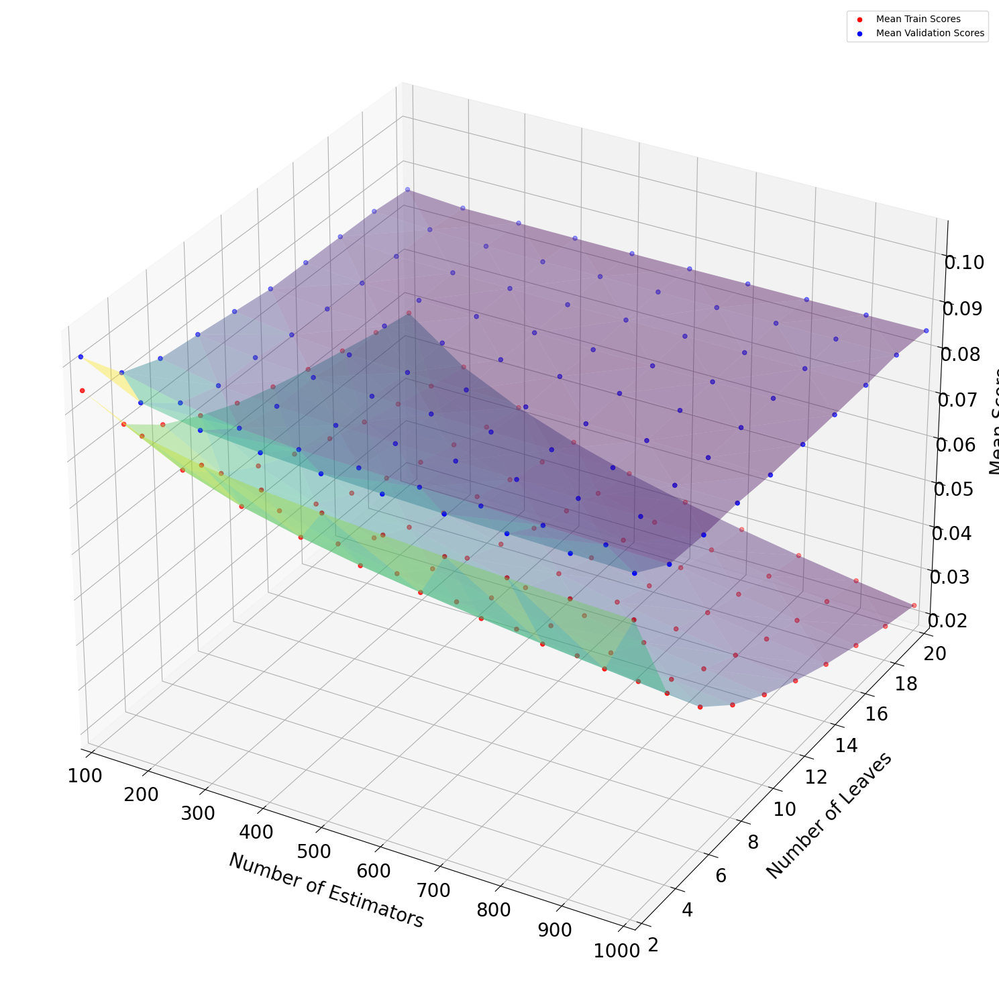

In [ ]:
plotscore(param_scores_df,"param_scores_df")

In [ ]:
def metric(X, Y):
  z=(X-Y)**0.5+X**0.5
  return z

<ipython-input-19-669337650ae7>:2: RuntimeWarning: invalid value encountered in sqrt
  z=(X-Y)**0.5+X**0.5


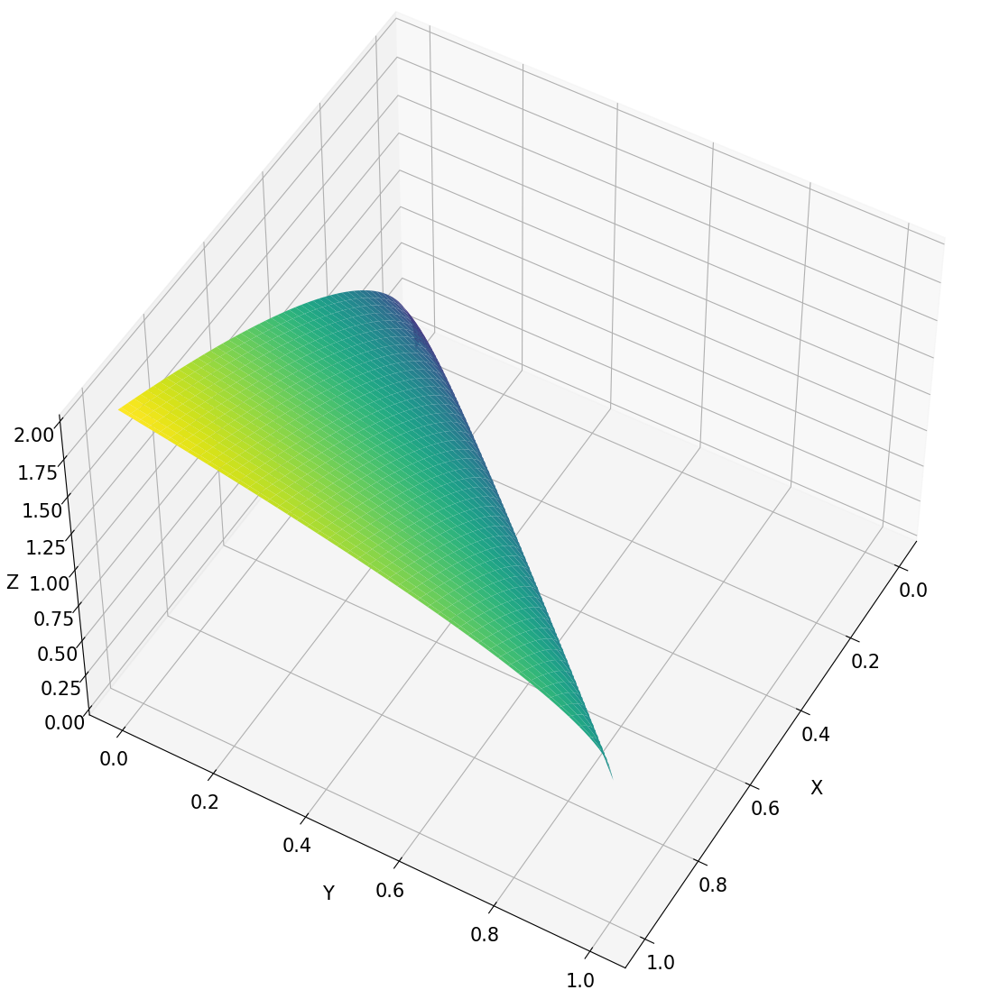

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
# Generate data for X and Y within the range (0, 1)
X = np.linspace(0, 1, 100)
Y = np.linspace(0, 1, 100)
X, Y = np.meshgrid(X, Y)

# Compute the corresponding Z values based on the equation
Z = metric(X, Y)

# Create a 3D plot
fig = plt.figure(figsize=(20, 14))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(X, Y, Z, cmap='viridis')

# Set the view to face the plot towards you
ax.view_init(elev=50, azim=30)

# Add labels and title
ax.set_xlabel('X',labelpad=10, fontsize=15)
ax.set_ylabel('Y',labelpad=10, fontsize=15)
ax.set_zlabel('Z',labelpad=8, fontsize=15)

ax.tick_params(which='major', labelsize=15)
plt.savefig("xz.pdf", dpi=300, bbox_inches='tight', format='pdf', transparent=True)

# Show the plot
plt.show()

In [ ]:
def plotesti(df, name):
  param_num_leaves = df['param_num_leaves'].values.astype(float)
  mean_train_score = df['mean_train_score'].values.astype(float)
  mean_test_score = df['mean_validation_score'].values.astype(float)
  x_values = df['param_n_estimators'].values.astype(float)

  # Connect dots with the same number of estimators
  unique_estimators = np.unique(x_values)
  num_estimators = len(unique_estimators)
  colors = cm.rainbow(np.linspace(0, 1, num_estimators))
  fig = plt.figure(figsize=(16, 10))
  for i, est in enumerate(unique_estimators):
    idx = np.where(x_values == est)[0]
    if len(idx) > 1:
        valid_indices = np.intersect1d(idx, np.arange(len(param_num_leaves)))
        if len(valid_indices) > 1:
            color = colors[i]  # Assign a color based on index
            plt.plot(param_num_leaves[valid_indices], metric(mean_test_score[valid_indices],mean_train_score[valid_indices]), marker='o', linestyle='-', alpha=0.5, color=color, label=f'{est}')
  # Calculate the index of the lowest point
  lowest_index = np.argmin(metric(mean_test_score,mean_train_score))
  print(df.iloc[lowest_index])
  # Plot the lowest point on top of the lines
  plt.scatter(param_num_leaves[lowest_index], metric(mean_test_score[lowest_index],mean_train_score[lowest_index]), c='black', marker='x', label='Lowest Point', zorder=10)
  # Annotate the coordinates
  plt.annotate(f'({(param_num_leaves[lowest_index], df.iloc[lowest_index][0])}, {"{:.4f}".format(metric(mean_test_score[lowest_index],mean_train_score[lowest_index]))})',
             (param_num_leaves[lowest_index], metric(mean_test_score[lowest_index],mean_train_score[lowest_index])),
             textcoords="offset points",
             xytext=(0,10),
             ha='left',fontsize=24)
  # Set labels for x-axis and y-axis
  plt.xlabel('Number of Leaves', fontsize=24)
  plt.ylabel('Metric', fontsize=24)
  # Add a legend
  plt.legend(bbox_to_anchor=(1.04, 1), loc="upper left",fontsize=24)
  plt.xticks(fontsize=24)
  plt.yticks(fontsize=24)
  plt.tight_layout()
  save_name = 'plot_' +name + '.pdf'
  plt.savefig(save_name, dpi=300, bbox_inches='tight', format='pdf', transparent=True)
  plt.show()
  return df.iloc[lowest_index]


param_n_estimators            300
param_num_leaves                2
mean_train_score         0.086188
mean_validation_score    0.093502
Name: 20, dtype: object


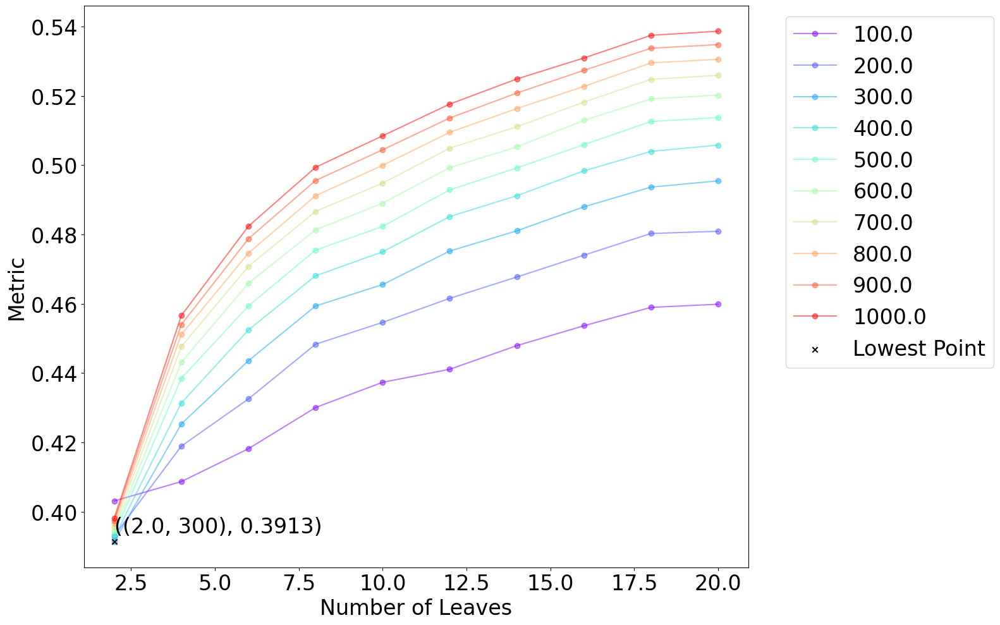

pandas.core.series.Series

In [ ]:
F1=plotesti(param_scores_df,"param_esti_df")
type(F1)

**Feature selection**

In [ ]:
def featureop(num_leaves, n_estimators, train, a1):
  regressor = LGBMRegressor(num_leaves=int(num_leaves), n_estimators=int(n_estimators), random_state=seed, verbose=-1)
  regressor.set_params(**{'force_row_wise': 'true'}) # use selected paramters
  feature_importance_scores = []
  train_scores = []
  val_scores = []
  for train_index, val_index in kf.split(train):
    X_train, X_val = train.iloc[train_index], train.iloc[val_index]

    y_train, y_val = a1[train_index], a1[val_index]

    regressor.fit(X_train, y_train)

    train_pred = regressor.predict(X_train)
    val_pred = regressor.predict(X_val)

    # Retrieve feature importance scores
    fold_feature_importance = regressor.feature_importances_
    feature_importance_scores.append(fold_feature_importance)

    train_score = loss(y_train, train_pred)
    val_score = loss(y_val, val_pred)

    train_scores.append(train_score)
    val_scores.append(val_score)
  aggregated_scores = np.mean(feature_importance_scores, axis=0)
  sorted_indices = np.argsort(aggregated_scores)[::-1]
  top_k_features = train.columns[sorted_indices]
  print('Average Train RMSE+MAE:', np.mean(train_scores))
  print('Average Validation RMSE+MAE:', np.mean(val_scores))

  return top_k_features, aggregated_scores,sorted_indices


In [ ]:
def plothis(top_k_features, aggregated_scores,sorted_indices,name):
  #histogram of features
  plt.figure(figsize=(20, 10))
  plt.bar(top_k_features, aggregated_scores[sorted_indices])
  plt.xlabel('Features',fontsize=11)
  plt.ylabel('Importance Score',fontsize=11)
  plt.xticks(rotation=90, ha='right', fontsize=11)
  plt.xlim(-0.5, len(top_k_features)-0.9)
  plt.tight_layout()
  save_name = 'plot_' +name + '.pdf'

  # Save the figure as PDF with 24pt text size
  plt.savefig(save_name, dpi=300, bbox_inches='tight', format='pdf', transparent=True)
  plt.show()

In [ ]:
top_k_features, aggregated_scores,sorted_indices=featureop(F1[1],F1[0],train,a1)

Average Train RMSE+MAE: 0.08618843930597728
Average Validation RMSE+MAE: 0.09350167117983069


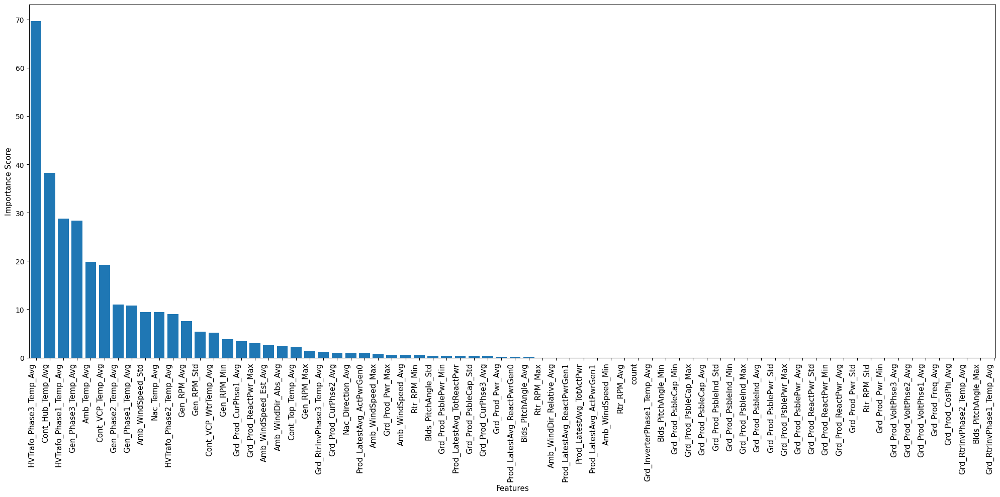

In [ ]:
plothis(top_k_features,aggregated_scores,sorted_indices,"a1_complex")

In [ ]:
df3=df2[top_k_features] #arrange columns by ranking
df3=mean_norm(df3)
df3

,HVTrafo_Phase3_Temp_Avg,Cont_Hub_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Amb_Temp_Avg,Cont_VCP_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase1_Temp_Avg,Amb_WindSpeed_Std,Nac_Temp_Avg,...,Rtr_RPM_Std,Grd_Prod_Pwr_Min,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_CosPhi_Avg,Grd_RtrInvPhase2_Temp_Avg,Blds_PitchAngle_Max,Grd_RtrInvPhase1_Temp_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.154930,0.392857,0.392157,0.318966,0.392857,0.433333,0.313559,0.285714,0.066667,0.307692,...,0.540541,0.006988,0.342020,0.392996,0.380392,0.5,0.625,0.28,0.669924,0.32
2016-01-01 00:20:00,0.154930,0.392857,0.392157,0.301724,0.392857,0.433333,0.296610,0.277778,0.074074,0.346154,...,0.581081,0.008991,0.319218,0.385214,0.360784,0.5,0.625,0.32,0.283388,0.36
2016-01-01 00:30:00,0.154930,0.392857,0.392157,0.301724,0.392857,0.433333,0.296610,0.269841,0.081481,0.307692,...,0.013514,0.012119,0.257329,0.291829,0.294118,0.5,0.750,0.36,0.032573,0.36
2016-01-01 00:40:00,0.154930,0.392857,0.392157,0.301724,0.392857,0.433333,0.305085,0.277778,0.088889,0.307692,...,0.027027,0.001124,0.254072,0.284047,0.286275,0.5,0.625,0.36,0.070575,0.40
2016-01-01 00:50:00,0.154930,0.392857,0.392157,0.310345,0.392857,0.433333,0.313559,0.285714,0.059259,0.307692,...,0.054054,0.094507,0.185668,0.264591,0.262745,0.5,1.000,0.40,0.017372,0.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,0.239437,0.392857,0.156863,0.112069,0.607143,0.366667,0.110169,0.103175,0.148148,0.423077,...,0.540541,0.011777,0.407166,0.361868,0.364706,0.5,0.750,0.16,0.996743,0.20
2016-07-18 01:50:00,0.253521,0.392857,0.176471,0.215517,0.607143,0.366667,0.237288,0.261905,0.155556,0.461538,...,0.027027,0.786894,0.384365,0.245136,0.262745,0.5,1.000,0.72,0.116178,0.72
2016-07-18 02:00:00,0.295775,0.392857,0.215686,0.344828,0.607143,0.400000,0.372881,0.404762,0.162963,0.423077,...,0.027027,0.811523,0.368078,0.221790,0.239216,0.5,1.000,0.84,0.128122,0.84


In [ ]:
train2, test2 = train_test_split(df3, test_size=0.4,shuffle=False)

print(len(train2))
print(a1.shape)
train2

17179
(17179,)


,HVTrafo_Phase3_Temp_Avg,Cont_Hub_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Amb_Temp_Avg,Cont_VCP_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase1_Temp_Avg,Amb_WindSpeed_Std,Nac_Temp_Avg,...,Rtr_RPM_Std,Grd_Prod_Pwr_Min,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_CosPhi_Avg,Grd_RtrInvPhase2_Temp_Avg,Blds_PitchAngle_Max,Grd_RtrInvPhase1_Temp_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.154930,0.392857,0.392157,0.318966,0.392857,0.433333,0.313559,0.285714,0.066667,0.307692,...,0.540541,0.006988,0.342020,0.392996,0.380392,0.5,0.625,0.28,0.669924,0.32
2016-01-01 00:20:00,0.154930,0.392857,0.392157,0.301724,0.392857,0.433333,0.296610,0.277778,0.074074,0.346154,...,0.581081,0.008991,0.319218,0.385214,0.360784,0.5,0.625,0.32,0.283388,0.36
2016-01-01 00:30:00,0.154930,0.392857,0.392157,0.301724,0.392857,0.433333,0.296610,0.269841,0.081481,0.307692,...,0.013514,0.012119,0.257329,0.291829,0.294118,0.5,0.750,0.36,0.032573,0.36
2016-01-01 00:40:00,0.154930,0.392857,0.392157,0.301724,0.392857,0.433333,0.305085,0.277778,0.088889,0.307692,...,0.027027,0.001124,0.254072,0.284047,0.286275,0.5,0.625,0.36,0.070575,0.40
2016-01-01 00:50:00,0.154930,0.392857,0.392157,0.310345,0.392857,0.433333,0.313559,0.285714,0.059259,0.307692,...,0.054054,0.094507,0.185668,0.264591,0.262745,0.5,1.000,0.40,0.017372,0.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.211268,0.321429,0.431373,0.431034,0.357143,0.400000,0.432203,0.428571,0.081481,0.230769,...,0.013514,0.512998,0.345277,0.237354,0.235294,0.5,1.000,0.48,0.004343,0.48
2016-04-29 08:20:00,0.225352,0.321429,0.450980,0.431034,0.357143,0.433333,0.432203,0.420635,0.081481,0.230769,...,0.054054,0.291390,0.407166,0.315175,0.317647,0.5,1.000,0.44,0.023887,0.44
2016-04-29 08:30:00,0.225352,0.321429,0.450980,0.422414,0.357143,0.433333,0.423729,0.412698,0.088889,0.230769,...,0.054054,0.269351,0.429967,0.342412,0.341176,0.5,1.000,0.44,0.004343,0.44


In [ ]:
def fselect(top_k_features, train2, a1, num_leaves, n_estimators):
  t = []
  v= []
  for i in range(1, len(top_k_features) + 1):
    selected_columns = top_k_features[:i]
    dfk = pd.DataFrame(train2, columns=selected_columns)
    regressor = LGBMRegressor(num_leaves=num_leaves,n_estimators= n_estimators, random_state=seed)
    train_scores = []
    val_scores = []
    for train_index, val_index in kf.split(train2):
      X_train, X_val = dfk.iloc[train_index], dfk.iloc[val_index]
      y_train, y_val = a1[train_index], a1[val_index]
      regressor.fit(X_train, y_train)
      train_pred = regressor.predict(X_train)
      val_pred = regressor.predict(X_val)
      train_score = loss(y_train, train_pred)
      val_score = loss(y_val, val_pred)
      train_scores.append(train_score)
      val_scores.append(val_score)

    t.append(np.mean(train_scores))
    v.append(np.mean(val_scores))

  return t, v

In [ ]:
t,v =fselect(top_k_features, train2, a1, F1[1], F1[0])

In [ ]:
def plotfs(t,v,name):
  t = np.array(t)
  v = np.array(v)
  plot_data = metric(v,t)
  x_values = [i + 1 for i in range(len(plot_data))]
  index = None
  for i, value in enumerate(plot_data):
    if value == plot_data[-1]:
      index = i
      break
  print("Index when value does not change(from 0):", index)
  print("Mean_train_score",t[index])
  print("Mean_validation_score",v[index])
  print("Metric",plot_data[index])
  lowest_point_idx = index+1
  plt.clf()
    # Annotate the coordinates

  plt.scatter(lowest_point_idx, plot_data[lowest_point_idx], color='red', marker='o', label='Lowest Point')
  plt.annotate(f'({lowest_point_idx}, {"{:.4f}".format(plot_data[lowest_point_idx])})',
             (lowest_point_idx, plot_data[lowest_point_idx]+0.01),
             ha='center',fontsize=12)
  plt.plot(x_values, plot_data, label='Metric')
  plt.xlabel('The number of features')
  plt.ylabel('Metric')
  plt.tight_layout()
  save_name = 'plot_' +name + '.pdf'
  plt.legend()
  plt.savefig(save_name)
  plt.show()
  return lowest_point_idx

Index when value does not change(from 0): 36
Mean_train_score 0.08618843930597728
Mean_validation_score 0.09350167117983069
Metric 0.3912978657683474


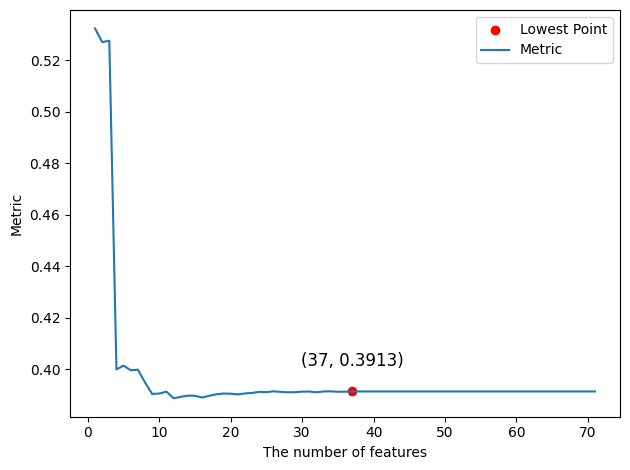

In [ ]:
F1_index=plotfs(t,v,"a1_complex_f")
#print("total number of features",F1_index)

**Verification**

In [ ]:
#verify the selection of parameter
selected_columns = top_k_features[:F1_index]
df = pd.DataFrame(train2, columns=selected_columns)
df

,HVTrafo_Phase3_Temp_Avg,Cont_Hub_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Gen_Phase3_Temp_Avg,Amb_Temp_Avg,Cont_VCP_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_Phase1_Temp_Avg,Amb_WindSpeed_Std,Nac_Temp_Avg,...,Amb_WindSpeed_Avg,Rtr_RPM_Min,Blds_PitchAngle_Std,Grd_Prod_PsblePwr_Min,Prod_LatestAvg_TotReactPwr,Grd_Prod_PsbleCap_Std,Grd_Prod_CurPhse3_Avg,Grd_Prod_Pwr_Avg,Prod_LatestAvg_ReactPwrGen0,Blds_PitchAngle_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.154930,0.392857,0.392157,0.318966,0.392857,0.433333,0.313559,0.285714,0.066667,0.307692,...,0.135266,0.000000,0.331828,0.00000,0.308477,0.249144,0.018914,0.018540,0.713592,0.112798
2016-01-01 00:20:00,0.154930,0.392857,0.392157,0.301724,0.392857,0.433333,0.296610,0.277778,0.074074,0.346154,...,0.188406,0.129252,0.279910,0.00000,0.318855,0.719839,0.050338,0.042653,0.819233,0.137744
2016-01-01 00:30:00,0.154930,0.392857,0.392157,0.301724,0.392857,0.433333,0.296610,0.269841,0.081481,0.307692,...,0.193237,0.727891,0.018059,0.00000,0.261776,0.495065,0.080685,0.080473,0.914008,0.019523
2016-01-01 00:40:00,0.154930,0.392857,0.392157,0.301724,0.392857,0.433333,0.305085,0.277778,0.088889,0.307692,...,0.178744,0.734694,0.027088,0.00000,0.272006,0.609668,0.063626,0.062327,0.895747,0.023861
2016-01-01 00:50:00,0.154930,0.392857,0.392157,0.310345,0.392857,0.433333,0.313559,0.285714,0.059259,0.307692,...,0.270531,0.755102,0.006772,0.07295,0.258621,0.055186,0.167834,0.171499,0.914008,0.005423
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.211268,0.321429,0.431373,0.431034,0.357143,0.400000,0.432203,0.428571,0.081481,0.230769,...,0.420290,0.979592,0.004515,0.49385,0.204445,0.018127,0.611241,0.615533,0.914008,0.002169
2016-04-29 08:20:00,0.225352,0.321429,0.450980,0.431034,0.357143,0.433333,0.432203,0.420635,0.081481,0.230769,...,0.376812,0.870748,0.004515,0.25610,0.219992,0.000000,0.452385,0.460602,0.914008,0.001085
2016-04-29 08:30:00,0.225352,0.321429,0.450980,0.422414,0.357143,0.433333,0.423729,0.412698,0.088889,0.230769,...,0.371981,0.891156,0.002257,0.24635,0.223570,0.000000,0.441492,0.450641,0.914008,0.001085


In [ ]:
param_easy=optimizer(df,a1)

print(param_easy)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.094625   
1                 100                4          0.081232   
2                 100                6          0.074887   
3                 100                8          0.070462   
4                 100               10          0.067090   
..                ...              ...               ...   
95               1000               12          0.033868   
96               1000               14          0.030667   
97               1000               16          0.028189   
98               1000               18          0.025968   
99               1000               20          0.024040   

    mean_validation_score  
0                0.101708  
1                0.092111  
2                0.089143  
3                0.088200  
4                0.086750  
..                    ...  
95               0.084309  
96               0.084015  
97               0.083905  

In [ ]:
#plotscore(param_easy,"param_easy")

param_n_estimators            300
param_num_leaves                2
mean_train_score         0.086188
mean_validation_score    0.093502
Name: 20, dtype: object


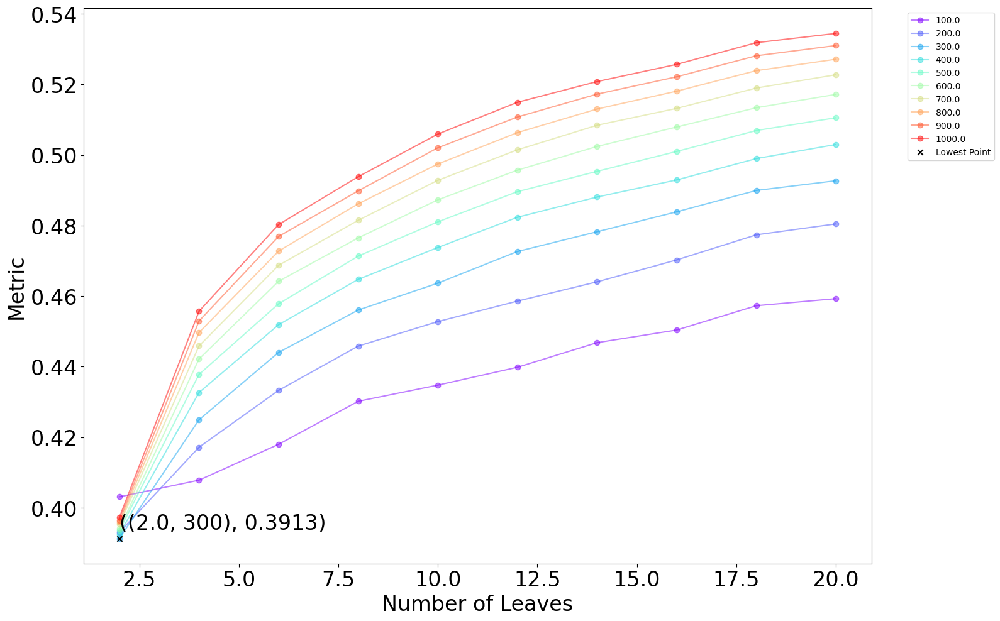

In [ ]:
F11=plotesti(param_easy,"param_easy_esti_df")

# **2 Gear bear temp**

In [ ]:
param_scores_df2=optimizer(train,a2)
print(param_scores_df2)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.067782   
1                 100                4          0.057960   
2                 100                6          0.053005   
3                 100                8          0.049841   
4                 100               10          0.047273   
..                ...              ...               ...   
95               1000               12          0.023132   
96               1000               14          0.020955   
97               1000               16          0.019036   
98               1000               18          0.017386   
99               1000               20          0.015902   

    mean_validation_score  
0                0.073260  
1                0.065979  
2                0.063859  
3                0.062569  
4                0.062217  
..                    ...  
95               0.059976  
96               0.059778  
97               0.060064  

In [ ]:
#plotscore(param_scores_df2,"param_scores_df2")

param_n_estimators            200
param_num_leaves                2
mean_train_score         0.064266
mean_validation_score    0.070383
Name: 10, dtype: object


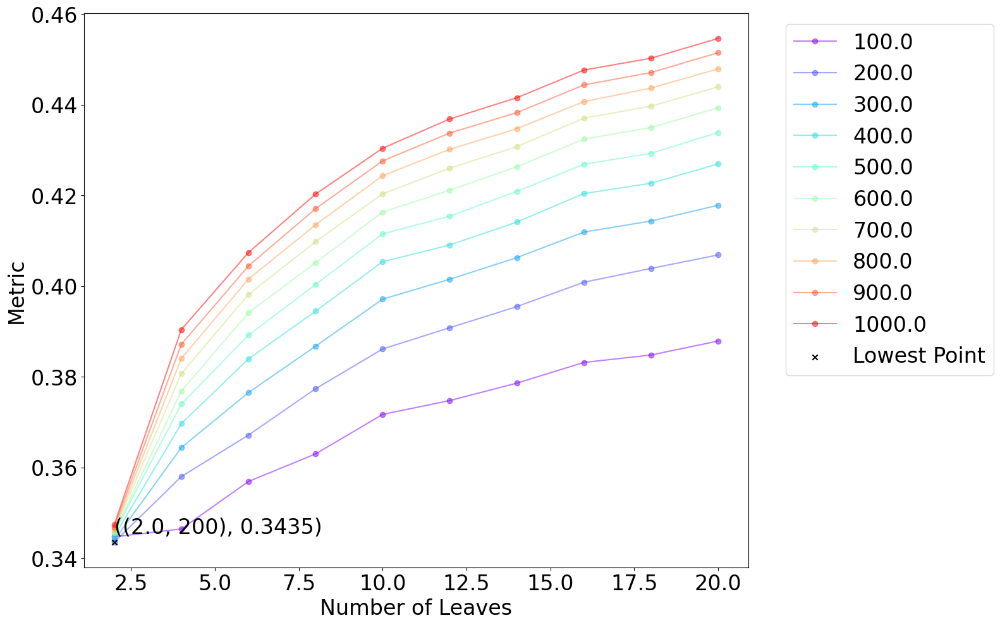

In [ ]:
F2=plotesti(param_scores_df2,"param_esti_df2")

**Feature selection**

In [ ]:
top_k_features2, aggregated_scores2,sorted_indices2=featureop(F2[1],F2[0],train, a2)

Average Train RMSE+MAE: 0.06426580421549308
Average Validation RMSE+MAE: 0.07038291596325494


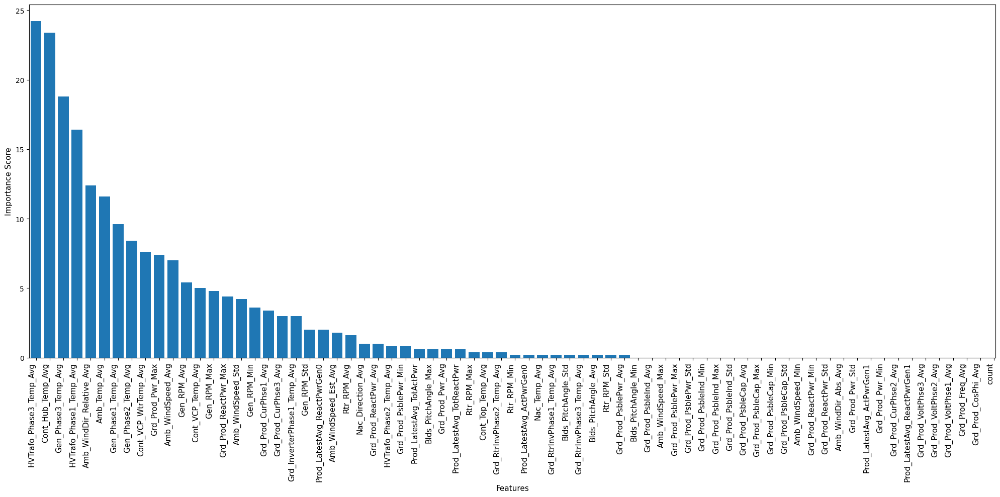

In [ ]:
plothis(top_k_features2, aggregated_scores2,sorted_indices2,"feature2")

In [ ]:
df3=df2[top_k_features2] #arrange columns by ranking
df3=mean_norm(df3)
df3

,HVTrafo_Phase3_Temp_Avg,Cont_Hub_Temp_Avg,Gen_Phase3_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Amb_WindDir_Relative_Avg,Amb_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Cont_VCP_WtrTemp_Avg,Grd_Prod_Pwr_Max,...,Prod_LatestAvg_ActPwrGen1,Grd_Prod_Pwr_Min,Grd_Prod_CurPhse2_Avg,Prod_LatestAvg_ReactPwrGen1,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_CosPhi_Avg,count
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.154930,0.392857,0.318966,0.392157,0.497636,0.392857,0.285714,0.313559,0.518519,0.059302,...,0.008548,0.006988,0.023317,0.312130,0.342020,0.392996,0.380392,0.5,0.625,0.000000
2016-01-01 00:20:00,0.154930,0.392857,0.301724,0.392157,0.484562,0.392857,0.277778,0.296610,0.555556,0.114442,...,0.032485,0.008991,0.053230,0.320582,0.319218,0.385214,0.360784,0.5,0.625,0.011834
2016-01-01 00:30:00,0.154930,0.392857,0.301724,0.392157,0.527399,0.392857,0.269841,0.296610,0.555556,0.128893,...,0.068943,0.012119,0.093329,0.261776,0.257329,0.291829,0.294118,0.5,0.750,0.000000
2016-01-01 00:40:00,0.154930,0.392857,0.301724,0.392157,0.565508,0.392857,0.277778,0.305085,0.592593,0.111215,...,0.050715,0.001124,0.075369,0.272343,0.254072,0.284047,0.286275,0.5,0.625,0.000000
2016-01-01 00:50:00,0.154930,0.392857,0.310345,0.392157,0.479555,0.392857,0.285714,0.313559,0.555556,0.234262,...,0.160802,0.094507,0.173880,0.258621,0.185668,0.264591,0.262745,0.5,1.000,0.005917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,0.239437,0.392857,0.112069,0.156863,0.506259,0.607143,0.103175,0.110169,0.444444,0.973202,...,0.032934,0.011777,0.039863,0.318808,0.407166,0.361868,0.364706,0.5,0.750,0.029586
2016-07-18 01:50:00,0.253521,0.392857,0.215517,0.176471,0.480668,0.607143,0.261905,0.237288,0.666667,0.995136,...,0.958123,0.786894,0.956780,0.174509,0.384365,0.245136,0.262745,0.5,1.000,0.023669
2016-07-18 02:00:00,0.295775,0.392857,0.344828,0.215686,0.474270,0.607143,0.404762,0.372881,0.777778,0.993640,...,0.993893,0.811523,0.992169,0.174859,0.368078,0.221790,0.239216,0.5,1.000,0.005917


In [ ]:
train2, test2 = train_test_split(df3, test_size=0.4,shuffle=False)

print(len(train2))
print(a1.shape)
train2

17179
(17179,)


,HVTrafo_Phase3_Temp_Avg,Cont_Hub_Temp_Avg,Gen_Phase3_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Amb_WindDir_Relative_Avg,Amb_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Cont_VCP_WtrTemp_Avg,Grd_Prod_Pwr_Max,...,Prod_LatestAvg_ActPwrGen1,Grd_Prod_Pwr_Min,Grd_Prod_CurPhse2_Avg,Prod_LatestAvg_ReactPwrGen1,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_CosPhi_Avg,count
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.154930,0.392857,0.318966,0.392157,0.497636,0.392857,0.285714,0.313559,0.518519,0.059302,...,0.008548,0.006988,0.023317,0.312130,0.342020,0.392996,0.380392,0.5,0.625,0.000000
2016-01-01 00:20:00,0.154930,0.392857,0.301724,0.392157,0.484562,0.392857,0.277778,0.296610,0.555556,0.114442,...,0.032485,0.008991,0.053230,0.320582,0.319218,0.385214,0.360784,0.5,0.625,0.011834
2016-01-01 00:30:00,0.154930,0.392857,0.301724,0.392157,0.527399,0.392857,0.269841,0.296610,0.555556,0.128893,...,0.068943,0.012119,0.093329,0.261776,0.257329,0.291829,0.294118,0.5,0.750,0.000000
2016-01-01 00:40:00,0.154930,0.392857,0.301724,0.392157,0.565508,0.392857,0.277778,0.305085,0.592593,0.111215,...,0.050715,0.001124,0.075369,0.272343,0.254072,0.284047,0.286275,0.5,0.625,0.000000
2016-01-01 00:50:00,0.154930,0.392857,0.310345,0.392157,0.479555,0.392857,0.285714,0.313559,0.555556,0.234262,...,0.160802,0.094507,0.173880,0.258621,0.185668,0.264591,0.262745,0.5,1.000,0.005917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.211268,0.321429,0.431034,0.431373,0.527399,0.357143,0.428571,0.432203,0.555556,0.708774,...,0.609728,0.512998,0.614026,0.204445,0.345277,0.237354,0.235294,0.5,1.000,0.000000
2016-04-29 08:20:00,0.225352,0.321429,0.431034,0.450980,0.458136,0.357143,0.420635,0.432203,0.555556,0.577027,...,0.453686,0.291390,0.457575,0.219992,0.407166,0.315175,0.317647,0.5,1.000,0.000000
2016-04-29 08:30:00,0.225352,0.321429,0.422414,0.450980,0.519054,0.357143,0.412698,0.423729,0.555556,0.584464,...,0.443821,0.269351,0.446211,0.223570,0.429967,0.342412,0.341176,0.5,1.000,0.005917


In [ ]:
t2,v2 = fselect(top_k_features2, train2, a2, F2[1],F2[0])

Index when value does not change(from 0): 43
Mean_train_score 0.06426580421549308
Mean_validation_score 0.07038291596325494
Metric 0.34350975411306117


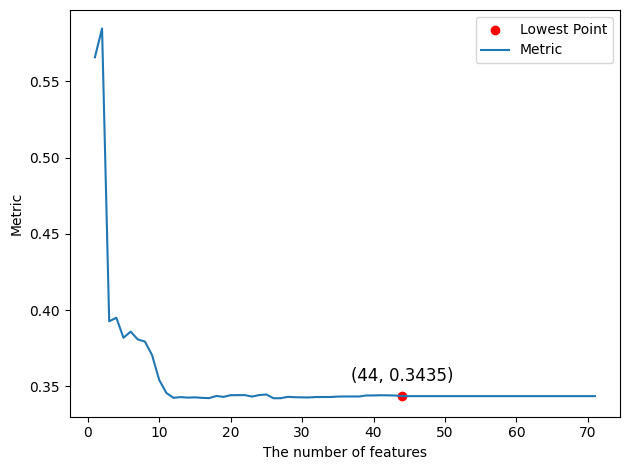

In [ ]:
F2_index=plotfs(t2,v2,"a2_complex_f")

**Verification**

In [ ]:
#verify the selection of parameter
selected_columns = top_k_features2[:F2_index]
df = pd.DataFrame(train2, columns=selected_columns)
df

,HVTrafo_Phase3_Temp_Avg,Cont_Hub_Temp_Avg,Gen_Phase3_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Amb_WindDir_Relative_Avg,Amb_Temp_Avg,Gen_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Cont_VCP_WtrTemp_Avg,Grd_Prod_Pwr_Max,...,Grd_RtrInvPhase2_Temp_Avg,Rtr_RPM_Min,Prod_LatestAvg_ActPwrGen0,Nac_Temp_Avg,Grd_RtrInvPhase1_Temp_Avg,Blds_PitchAngle_Std,Grd_RtrInvPhase3_Temp_Avg,Blds_PitchAngle_Avg,Rtr_RPM_Std,Grd_Prod_PsblePwr_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.154930,0.392857,0.318966,0.392157,0.497636,0.392857,0.285714,0.313559,0.518519,0.059302,...,0.28,0.000000,0.735791,0.307692,0.32,0.331828,0.347826,0.112798,0.540541,0.01085
2016-01-01 00:20:00,0.154930,0.392857,0.301724,0.392157,0.484562,0.392857,0.277778,0.296610,0.555556,0.114442,...,0.32,0.129252,0.729839,0.346154,0.36,0.279910,0.347826,0.137744,0.581081,0.04445
2016-01-01 00:30:00,0.154930,0.392857,0.301724,0.392157,0.527399,0.392857,0.269841,0.296610,0.555556,0.128893,...,0.36,0.727891,0.880376,0.307692,0.36,0.018059,0.391304,0.019523,0.013514,0.06765
2016-01-01 00:40:00,0.154930,0.392857,0.301724,0.392157,0.565508,0.392857,0.277778,0.305085,0.592593,0.111215,...,0.36,0.734694,0.865975,0.307692,0.40,0.027088,0.391304,0.023861,0.027027,0.05135
2016-01-01 00:50:00,0.154930,0.392857,0.310345,0.392157,0.479555,0.392857,0.285714,0.313559,0.555556,0.234262,...,0.40,0.755102,0.880376,0.307692,0.40,0.006772,0.391304,0.005423,0.054054,0.16035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.211268,0.321429,0.431034,0.431373,0.527399,0.357143,0.428571,0.432203,0.555556,0.708774,...,0.48,0.979592,0.880376,0.230769,0.48,0.004515,0.478261,0.002169,0.013514,0.61050
2016-04-29 08:20:00,0.225352,0.321429,0.431034,0.450980,0.458136,0.357143,0.420635,0.432203,0.555556,0.577027,...,0.44,0.870748,0.880376,0.230769,0.44,0.004515,0.434783,0.001085,0.054054,0.45315
2016-04-29 08:30:00,0.225352,0.321429,0.422414,0.450980,0.519054,0.357143,0.412698,0.423729,0.555556,0.584464,...,0.44,0.891156,0.880376,0.230769,0.44,0.002257,0.434783,0.001085,0.054054,0.44335


In [ ]:
param_easy=optimizer(df,a2)

print(param_easy)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.067782   
1                 100                4          0.058060   
2                 100                6          0.053109   
3                 100                8          0.049980   
4                 100               10          0.047190   
..                ...              ...               ...   
95               1000               12          0.023676   
96               1000               14          0.021633   
97               1000               16          0.019919   
98               1000               18          0.018403   
99               1000               20          0.017099   

    mean_validation_score  
0                0.073260  
1                0.066030  
2                0.063818  
3                0.062240  
4                0.061844  
..                    ...  
95               0.059659  
96               0.060213  
97               0.059866  

In [ ]:
#plotscore(param_easy,"param_easy")

param_n_estimators            200
param_num_leaves                2
mean_train_score         0.064266
mean_validation_score    0.070383
Name: 10, dtype: object


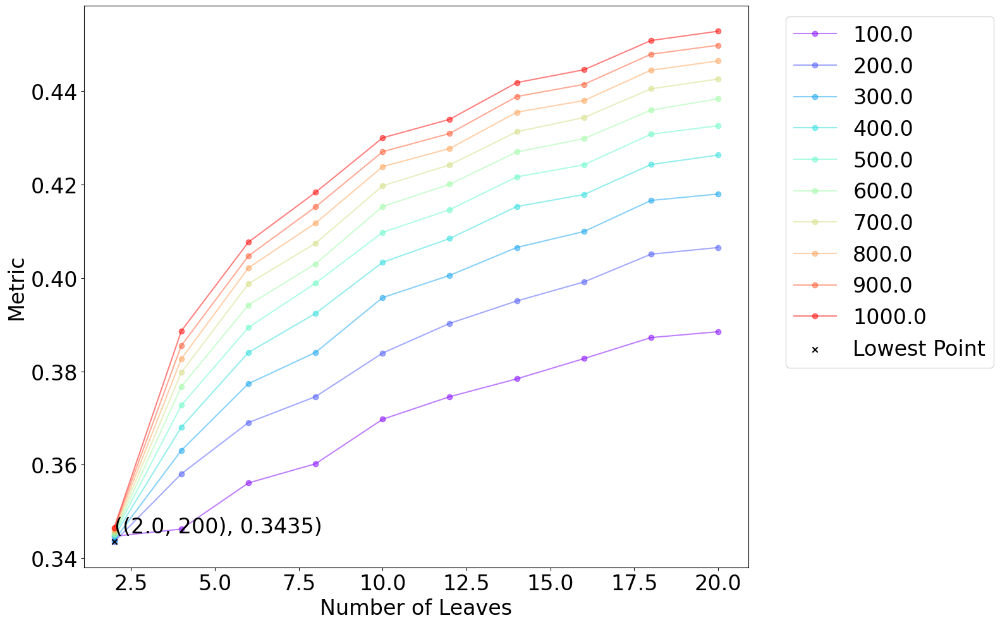

In [ ]:
F21=plotesti(param_easy,"param_easy_esti_df2")

# **3 Gen bear temp**

In [ ]:
param_scores_df2=optimizer(train,a3)
print(param_scores_df2)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.088639   
1                 100                4          0.079535   
2                 100                6          0.073486   
3                 100                8          0.069200   
4                 100               10          0.065903   
..                ...              ...               ...   
95               1000               12          0.028901   
96               1000               14          0.025694   
97               1000               16          0.022919   
98               1000               18          0.020676   
99               1000               20          0.018515   

    mean_validation_score  
0                0.098659  
1                0.096129  
2                0.094094  
3                0.093654  
4                0.094220  
..                    ...  
95               0.096694  
96               0.096573  
97               0.095984  

In [ ]:
#plotscore(param_scores_df2,"param_scores_df2")

param_n_estimators            100
param_num_leaves                2
mean_train_score         0.088639
mean_validation_score    0.098659
Name: 0, dtype: object


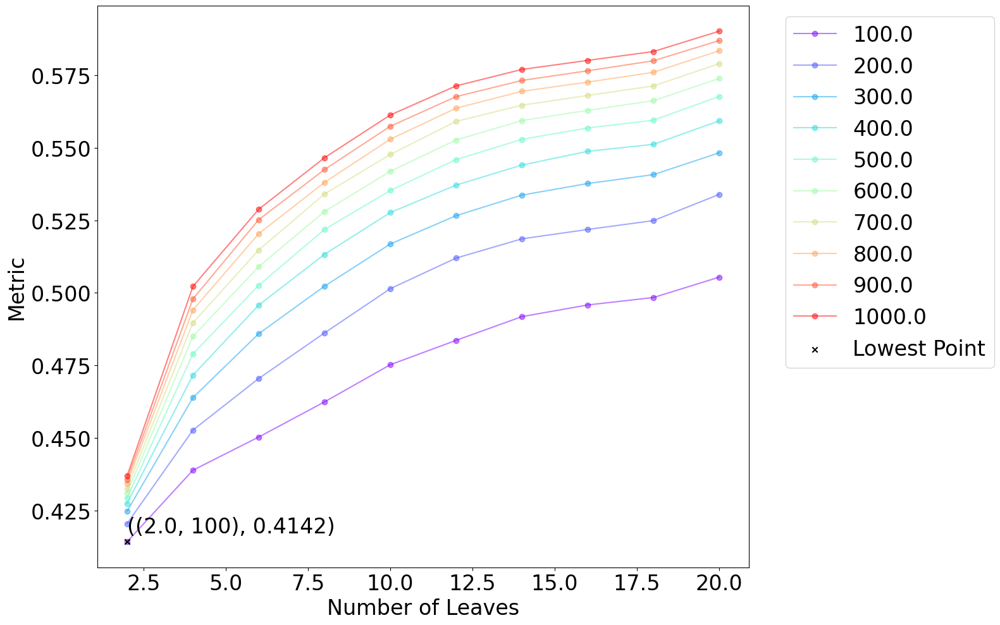

In [ ]:
F3=plotesti(param_scores_df2,"param_esti_df3")

**Part 1.3: Feature selection**

In [ ]:
top_k_features3, aggregated_scores3,sorted_indices3=featureop(F3[1],F3[0],train, a3)

Average Train RMSE+MAE: 0.0886385412270495
Average Validation RMSE+MAE: 0.09865913094003805


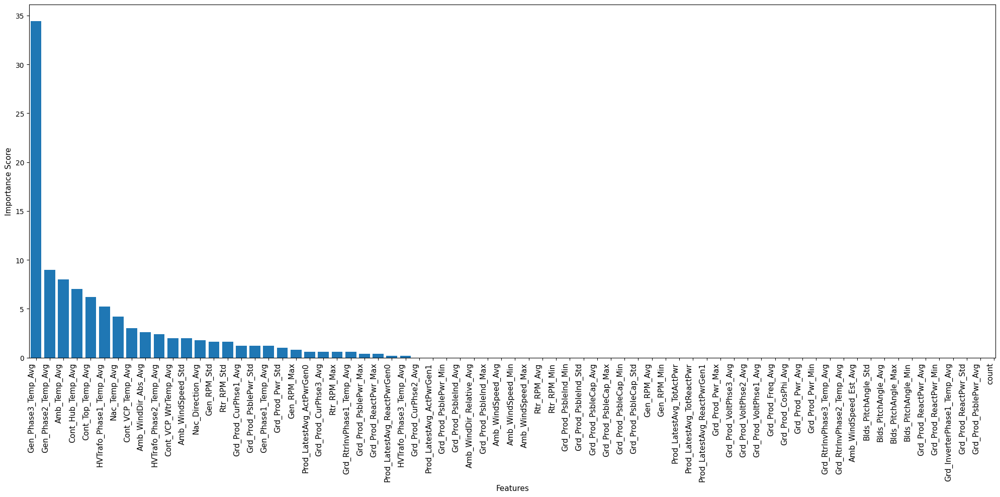

In [ ]:
plothis(top_k_features3, aggregated_scores3,sorted_indices3,"feature3")

In [ ]:
df3=df2[top_k_features3] #arrange columns by ranking
df3=mean_norm(df3)
df3

,Gen_Phase3_Temp_Avg,Gen_Phase2_Temp_Avg,Amb_Temp_Avg,Cont_Hub_Temp_Avg,Cont_Top_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Nac_Temp_Avg,Cont_VCP_Temp_Avg,Amb_WindDir_Abs_Avg,HVTrafo_Phase2_Temp_Avg,...,Blds_PitchAngle_Std,Blds_PitchAngle_Avg,Blds_PitchAngle_Max,Blds_PitchAngle_Min,Grd_Prod_ReactPwr_Avg,Grd_Prod_ReactPwr_Min,Grd_InverterPhase1_Temp_Avg,Grd_Prod_ReactPwr_Std,Grd_Prod_PsblePwr_Avg,count
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.318966,0.313559,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.605571,0.245614,...,0.331828,0.112798,0.669924,0.025806,0.308740,0.580793,0.375000,0.061326,0.01085,0.000000
2016-01-01 00:20:00,0.301724,0.296610,0.392857,0.392857,0.357143,0.392157,0.346154,0.433333,0.577716,0.245614,...,0.279910,0.137744,0.283388,0.011828,0.318638,0.575636,0.416667,0.274371,0.04445,0.011834
2016-01-01 00:30:00,0.301724,0.296610,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.646240,0.245614,...,0.018059,0.019523,0.032573,0.015054,0.261776,0.577570,0.416667,0.032613,0.06765,0.000000
2016-01-01 00:40:00,0.301724,0.305085,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.684123,0.245614,...,0.027088,0.023861,0.070575,0.013978,0.272025,0.576281,0.416667,0.063453,0.05135,0.000000
2016-01-01 00:50:00,0.310345,0.313559,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.595265,0.245614,...,0.006772,0.005423,0.017372,0.010753,0.258617,0.575701,0.416667,0.009926,0.16035,0.005917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,0.112069,0.110169,0.607143,0.392857,0.357143,0.156863,0.423077,0.366667,0.360446,0.157895,...,0.566591,0.888286,0.996743,0.053763,0.313794,0.504608,0.250000,0.092520,0.90445,0.029586
2016-07-18 01:50:00,0.215517,0.237288,0.607143,0.392857,0.321429,0.176471,0.461538,0.366667,0.334540,0.175439,...,0.051919,0.034707,0.116178,0.013978,0.174517,0.499001,0.708333,0.004963,0.95590,0.023669
2016-07-18 02:00:00,0.344828,0.372881,0.607143,0.392857,0.357143,0.215686,0.423077,0.400000,0.303900,0.228070,...,0.056433,0.067245,0.128122,0.018280,0.174798,0.499581,0.833333,0.004786,0.99415,0.005917


In [ ]:
train2, test2 = train_test_split(df3, test_size=0.4,shuffle=False)

print(len(train2))
print(a1.shape)
train2

17179
(17179,)


,Gen_Phase3_Temp_Avg,Gen_Phase2_Temp_Avg,Amb_Temp_Avg,Cont_Hub_Temp_Avg,Cont_Top_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Nac_Temp_Avg,Cont_VCP_Temp_Avg,Amb_WindDir_Abs_Avg,HVTrafo_Phase2_Temp_Avg,...,Blds_PitchAngle_Std,Blds_PitchAngle_Avg,Blds_PitchAngle_Max,Blds_PitchAngle_Min,Grd_Prod_ReactPwr_Avg,Grd_Prod_ReactPwr_Min,Grd_InverterPhase1_Temp_Avg,Grd_Prod_ReactPwr_Std,Grd_Prod_PsblePwr_Avg,count
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.318966,0.313559,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.605571,0.245614,...,0.331828,0.112798,0.669924,0.025806,0.308740,0.580793,0.375000,0.061326,0.01085,0.000000
2016-01-01 00:20:00,0.301724,0.296610,0.392857,0.392857,0.357143,0.392157,0.346154,0.433333,0.577716,0.245614,...,0.279910,0.137744,0.283388,0.011828,0.318638,0.575636,0.416667,0.274371,0.04445,0.011834
2016-01-01 00:30:00,0.301724,0.296610,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.646240,0.245614,...,0.018059,0.019523,0.032573,0.015054,0.261776,0.577570,0.416667,0.032613,0.06765,0.000000
2016-01-01 00:40:00,0.301724,0.305085,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.684123,0.245614,...,0.027088,0.023861,0.070575,0.013978,0.272025,0.576281,0.416667,0.063453,0.05135,0.000000
2016-01-01 00:50:00,0.310345,0.313559,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.595265,0.245614,...,0.006772,0.005423,0.017372,0.010753,0.258617,0.575701,0.416667,0.009926,0.16035,0.005917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.431034,0.432203,0.357143,0.321429,0.250000,0.431373,0.230769,0.400000,0.395265,0.280702,...,0.004515,0.002169,0.004343,0.009677,0.204423,0.523300,0.500000,0.010635,0.61050,0.000000
2016-04-29 08:20:00,0.431034,0.432203,0.357143,0.321429,0.250000,0.450980,0.230769,0.433333,0.348189,0.298246,...,0.004515,0.001085,0.023887,0.006452,0.220007,0.537158,0.458333,0.011698,0.45315,0.000000
2016-04-29 08:30:00,0.422414,0.423729,0.357143,0.321429,0.285714,0.450980,0.230769,0.433333,0.410306,0.298246,...,0.002257,0.001085,0.004343,0.009677,0.223657,0.542765,0.416667,0.007267,0.44335,0.005917


In [ ]:
t3,v3 = fselect(top_k_features2, train2, a3, F3[1],F3[0])

Index when value does not change(from 0): 60
Mean_train_score 0.0886385412270495
Mean_validation_score 0.09865913094003805
Metric 0.41420340651528925


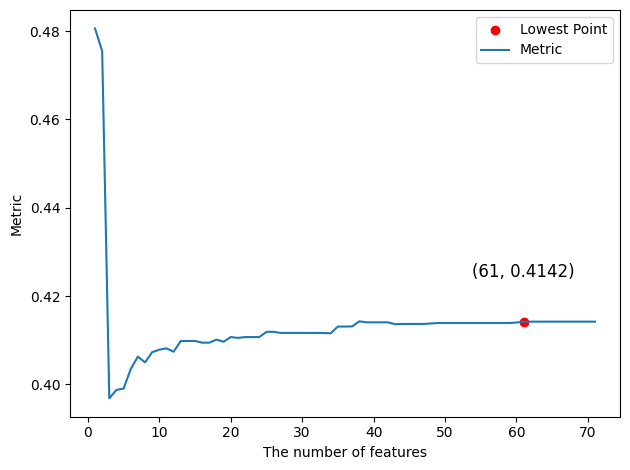

In [ ]:
F3_index=plotfs(t3,v3,"a3_complex_f")

**Part 2.3: Verification**

In [ ]:
#verify the selection of parameter
selected_columns = top_k_features3[:F3_index]
df = pd.DataFrame(train2, columns=selected_columns)
df

,Gen_Phase3_Temp_Avg,Gen_Phase2_Temp_Avg,Amb_Temp_Avg,Cont_Hub_Temp_Avg,Cont_Top_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Nac_Temp_Avg,Cont_VCP_Temp_Avg,Amb_WindDir_Abs_Avg,HVTrafo_Phase2_Temp_Avg,...,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_CosPhi_Avg,Grd_Prod_Pwr_Avg,Grd_Prod_Pwr_Min,Grd_RtrInvPhase3_Temp_Avg,Grd_RtrInvPhase2_Temp_Avg,Amb_WindSpeed_Est_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.318966,0.313559,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.605571,0.245614,...,0.342020,0.392996,0.380392,0.5,0.625,0.018540,0.006988,0.347826,0.28,0.160976
2016-01-01 00:20:00,0.301724,0.296610,0.392857,0.392857,0.357143,0.392157,0.346154,0.433333,0.577716,0.245614,...,0.319218,0.385214,0.360784,0.5,0.625,0.042653,0.008991,0.347826,0.32,0.200000
2016-01-01 00:30:00,0.301724,0.296610,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.646240,0.245614,...,0.257329,0.291829,0.294118,0.5,0.750,0.080473,0.012119,0.391304,0.36,0.224390
2016-01-01 00:40:00,0.301724,0.305085,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.684123,0.245614,...,0.254072,0.284047,0.286275,0.5,0.625,0.062327,0.001124,0.391304,0.36,0.209756
2016-01-01 00:50:00,0.310345,0.313559,0.392857,0.392857,0.357143,0.392157,0.307692,0.433333,0.595265,0.245614,...,0.185668,0.264591,0.262745,0.5,1.000,0.171499,0.094507,0.391304,0.40,0.282927
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.431034,0.432203,0.357143,0.321429,0.250000,0.431373,0.230769,0.400000,0.395265,0.280702,...,0.345277,0.237354,0.235294,0.5,1.000,0.615533,0.512998,0.478261,0.48,0.434146
2016-04-29 08:20:00,0.431034,0.432203,0.357143,0.321429,0.250000,0.450980,0.230769,0.433333,0.348189,0.298246,...,0.407166,0.315175,0.317647,0.5,1.000,0.460602,0.291390,0.434783,0.44,0.395122
2016-04-29 08:30:00,0.422414,0.423729,0.357143,0.321429,0.285714,0.450980,0.230769,0.433333,0.410306,0.298246,...,0.429967,0.342412,0.341176,0.5,1.000,0.450641,0.269351,0.434783,0.44,0.390244


In [ ]:
param_easy=optimizer(df,a3)

print(param_easy)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.088639   
1                 100                4          0.079562   
2                 100                6          0.073578   
3                 100                8          0.069238   
4                 100               10          0.065807   
..                ...              ...               ...   
95               1000               12          0.029106   
96               1000               14          0.025750   
97               1000               16          0.023219   
98               1000               18          0.021084   
99               1000               20          0.018895   

    mean_validation_score  
0                0.098659  
1                0.095909  
2                0.094298  
3                0.093856  
4                0.094220  
..                    ...  
95               0.095746  
96               0.095955  
97               0.096534  

In [ ]:
#plotscore(param_easy,"param_easy")

param_n_estimators            100
param_num_leaves                2
mean_train_score         0.088639
mean_validation_score    0.098659
Name: 0, dtype: object


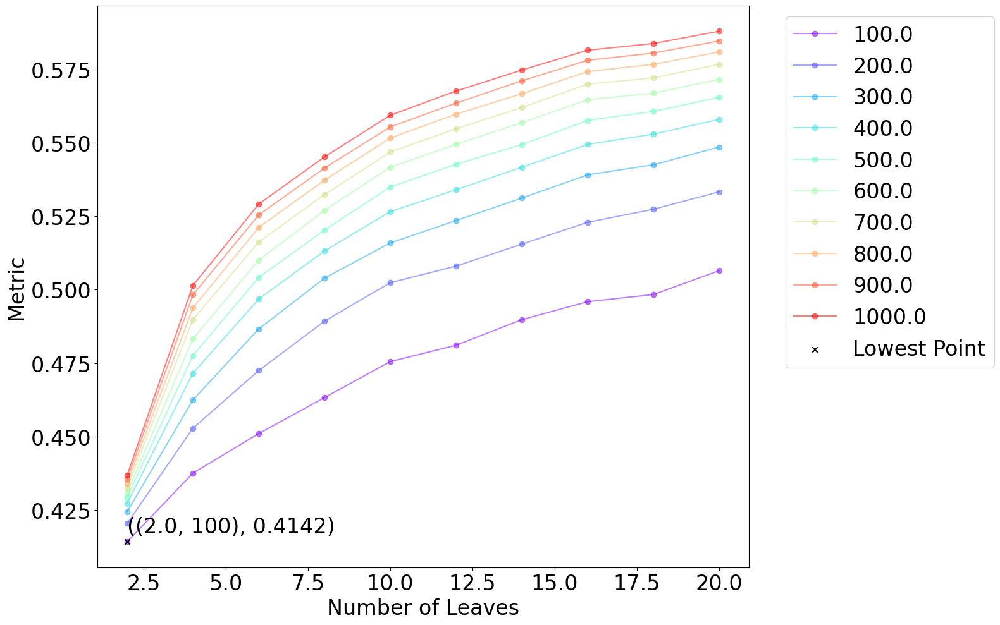

In [ ]:
F32=plotesti(param_easy,"param_easy_esti_df")

# **4 Hyd oil temp**

In [ ]:
param_scores_df2=optimizer(train,a4)
print(param_scores_df2)

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


    param_n_estimators  param_num_leaves  mean_train_score  \
0                  100                 2          0.086910   
1                  100                 4          0.070565   
2                  100                 6          0.063183   
3                  100                 8          0.058576   
4                  100                10          0.055360   
..                 ...               ...               ...   
95                1000                12          0.026058   
96                1000                14          0.023469   
97                1000                16          0.021053   
98                1000                18          0.019159   
99                1000                20          0.017538   

    mean_validation_score  
0                0.099221  
1                0.088457  
2                0.085208  
3                0.083292  
4                0.081939  
..                    ...  
95               0.078120  
96               0.078424  
97 

param_n_estimators       1000.000000
param_num_leaves            2.000000
mean_train_score            0.071251
mean_validation_score       0.087449
Name: 90, dtype: float64


<ipython-input-17-c6ea34ee6379>:25: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.annotate(f'({(param_num_leaves[lowest_index], df.iloc[lowest_index][0])}, {"{:.4f}".format(metric(mean_test_score[lowest_index],mean_train_score[lowest_index]))})',


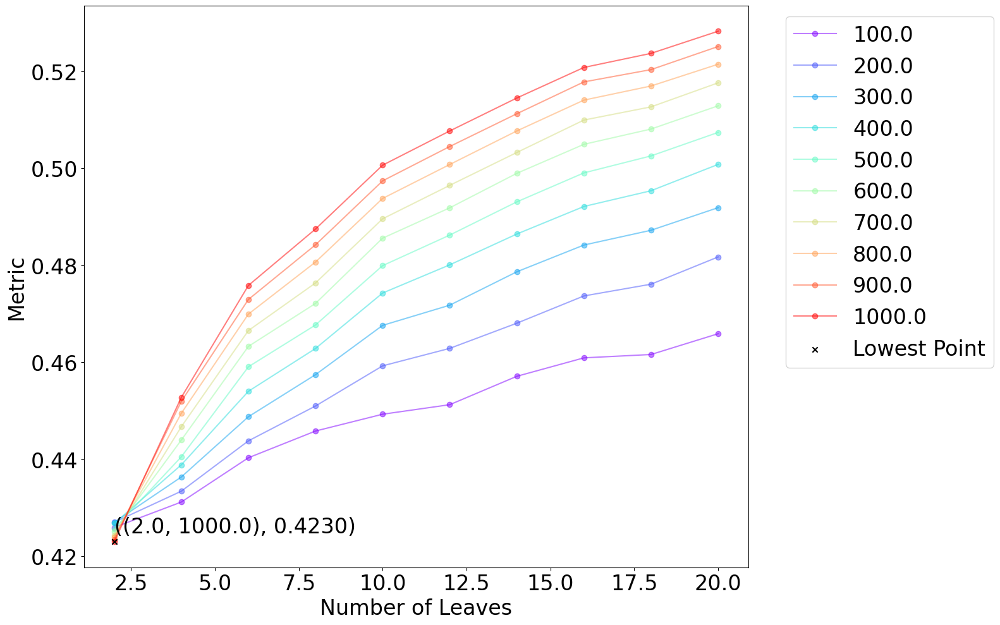

In [ ]:
F4=plotesti(param_scores_df2,"param_esti_df2")

**Part 1.3: Feature selection**

In [ ]:
top_k_features4, aggregated_scores4,sorted_indices4=featureop(F4[1],F4[0],train, a4)

Average Train RMSE+MAE: 0.07125097562071743
Average Validation RMSE+MAE: 0.08744862186108088


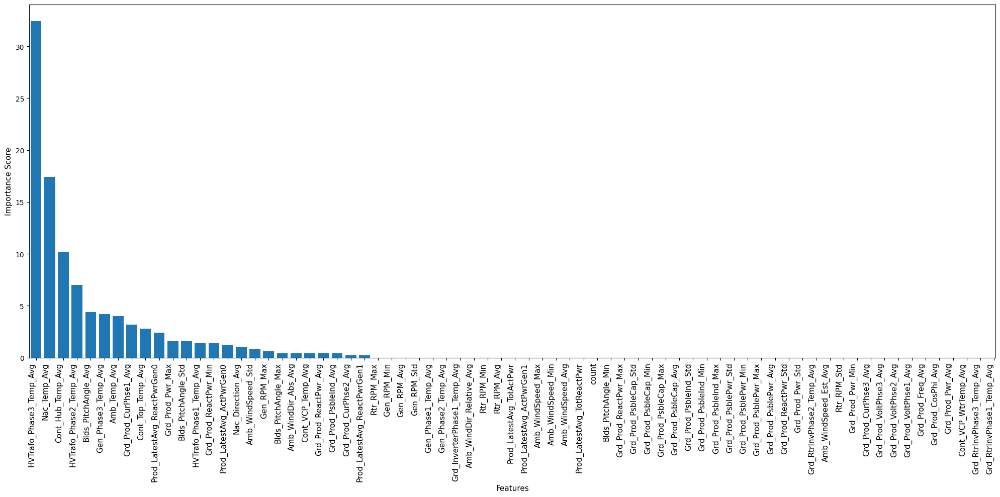

In [ ]:
plothis(top_k_features4, aggregated_scores4,sorted_indices4,"feature4")

In [ ]:
df3=df2[top_k_features4] #arrange columns by ranking
df3=mean_norm(df3)
df3

,HVTrafo_Phase3_Temp_Avg,Nac_Temp_Avg,Cont_Hub_Temp_Avg,HVTrafo_Phase2_Temp_Avg,Blds_PitchAngle_Avg,Gen_Phase3_Temp_Avg,Amb_Temp_Avg,Grd_Prod_CurPhse1_Avg,Cont_Top_Temp_Avg,Prod_LatestAvg_ReactPwrGen0,...,Grd_Prod_CurPhse3_Avg,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_CosPhi_Avg,Grd_Prod_Pwr_Avg,Cont_VCP_WtrTemp_Avg,Grd_RtrInvPhase3_Temp_Avg,Grd_RtrInvPhase1_Temp_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.154930,0.307692,0.392857,0.245614,0.112798,0.318966,0.392857,0.019618,0.357143,0.713592,...,0.018914,0.342020,0.392996,0.380392,0.5,0.625,0.018540,0.518519,0.347826,0.32
2016-01-01 00:20:00,0.154930,0.346154,0.392857,0.245614,0.137744,0.301724,0.392857,0.045954,0.357143,0.819233,...,0.050338,0.319218,0.385214,0.360784,0.5,0.625,0.042653,0.555556,0.347826,0.36
2016-01-01 00:30:00,0.154930,0.307692,0.392857,0.245614,0.019523,0.301724,0.392857,0.075382,0.357143,0.914008,...,0.080685,0.257329,0.291829,0.294118,0.5,0.750,0.080473,0.555556,0.391304,0.36
2016-01-01 00:40:00,0.154930,0.307692,0.392857,0.245614,0.023861,0.301724,0.392857,0.061471,0.357143,0.895747,...,0.063626,0.254072,0.284047,0.286275,0.5,0.625,0.062327,0.592593,0.391304,0.40
2016-01-01 00:50:00,0.154930,0.307692,0.392857,0.245614,0.005423,0.310345,0.392857,0.154271,0.357143,0.914008,...,0.167834,0.185668,0.264591,0.262745,0.5,1.000,0.171499,0.555556,0.391304,0.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,0.239437,0.423077,0.392857,0.157895,0.888286,0.112069,0.607143,0.041317,0.357143,0.669209,...,0.041061,0.407166,0.361868,0.364706,0.5,0.750,0.044280,0.444444,0.173913,0.20
2016-07-18 01:50:00,0.253521,0.461538,0.392857,0.175439,0.034707,0.215517,0.607143,0.955056,0.321429,0.914008,...,0.954869,0.384365,0.245136,0.262745,0.5,1.000,0.960454,0.666667,0.739130,0.72
2016-07-18 02:00:00,0.295775,0.423077,0.392857,0.228070,0.067245,0.344828,0.607143,0.990964,0.357143,0.914008,...,0.991261,0.368078,0.221790,0.239216,0.5,1.000,0.995464,0.777778,0.826087,0.84


In [ ]:
train2, test2 = train_test_split(df3, test_size=0.4,shuffle=False)

print(len(train2))
print(a1.shape)
train2

17179
(17179,)


,HVTrafo_Phase3_Temp_Avg,Nac_Temp_Avg,Cont_Hub_Temp_Avg,HVTrafo_Phase2_Temp_Avg,Blds_PitchAngle_Avg,Gen_Phase3_Temp_Avg,Amb_Temp_Avg,Grd_Prod_CurPhse1_Avg,Cont_Top_Temp_Avg,Prod_LatestAvg_ReactPwrGen0,...,Grd_Prod_CurPhse3_Avg,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_CosPhi_Avg,Grd_Prod_Pwr_Avg,Cont_VCP_WtrTemp_Avg,Grd_RtrInvPhase3_Temp_Avg,Grd_RtrInvPhase1_Temp_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.154930,0.307692,0.392857,0.245614,0.112798,0.318966,0.392857,0.019618,0.357143,0.713592,...,0.018914,0.342020,0.392996,0.380392,0.5,0.625,0.018540,0.518519,0.347826,0.32
2016-01-01 00:20:00,0.154930,0.346154,0.392857,0.245614,0.137744,0.301724,0.392857,0.045954,0.357143,0.819233,...,0.050338,0.319218,0.385214,0.360784,0.5,0.625,0.042653,0.555556,0.347826,0.36
2016-01-01 00:30:00,0.154930,0.307692,0.392857,0.245614,0.019523,0.301724,0.392857,0.075382,0.357143,0.914008,...,0.080685,0.257329,0.291829,0.294118,0.5,0.750,0.080473,0.555556,0.391304,0.36
2016-01-01 00:40:00,0.154930,0.307692,0.392857,0.245614,0.023861,0.301724,0.392857,0.061471,0.357143,0.895747,...,0.063626,0.254072,0.284047,0.286275,0.5,0.625,0.062327,0.592593,0.391304,0.40
2016-01-01 00:50:00,0.154930,0.307692,0.392857,0.245614,0.005423,0.310345,0.392857,0.154271,0.357143,0.914008,...,0.167834,0.185668,0.264591,0.262745,0.5,1.000,0.171499,0.555556,0.391304,0.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.211268,0.230769,0.321429,0.280702,0.002169,0.431034,0.357143,0.604007,0.250000,0.914008,...,0.611241,0.345277,0.237354,0.235294,0.5,1.000,0.615533,0.555556,0.478261,0.48
2016-04-29 08:20:00,0.225352,0.230769,0.321429,0.298246,0.001085,0.431034,0.357143,0.445217,0.250000,0.914008,...,0.452385,0.407166,0.315175,0.317647,0.5,1.000,0.460602,0.555556,0.434783,0.44
2016-04-29 08:30:00,0.225352,0.230769,0.321429,0.298246,0.001085,0.422414,0.357143,0.434397,0.285714,0.914008,...,0.441492,0.429967,0.342412,0.341176,0.5,1.000,0.450641,0.555556,0.434783,0.44


In [ ]:
t4,v4 = fselect(top_k_features4, train2, a4, F4[1],F4[0])

Index when value does not change(from 0): 24
Mean_train_score 0.08691009549822484
Mean_validation_score 0.09922082866492926
Metric 0.4259471221286241
Annotating at: (25, 0.4259471221286241)


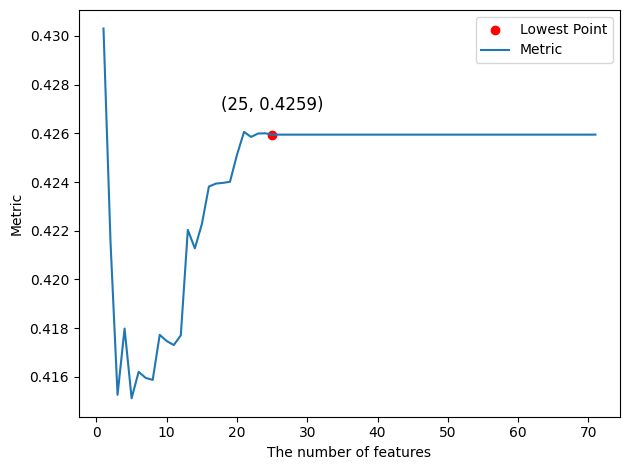

In [ ]:
F4_index=plotfs(t4,v4,"a4_complex_f")

**Part 2.3: Verification**

In [ ]:
#verify the selection of parameter
selected_columns = top_k_features4[:F4_index+1]
df = pd.DataFrame(train2, columns=selected_columns)
df

,HVTrafo_Phase3_Temp_Avg,Nac_Temp_Avg,Cont_Hub_Temp_Avg,HVTrafo_Phase2_Temp_Avg,Blds_PitchAngle_Avg,Gen_Phase3_Temp_Avg,Amb_Temp_Avg,Grd_Prod_CurPhse1_Avg,Cont_Top_Temp_Avg,Prod_LatestAvg_ReactPwrGen0,...,Amb_WindSpeed_Std,Gen_RPM_Max,Blds_PitchAngle_Max,Amb_WindDir_Abs_Avg,Cont_VCP_Temp_Avg,Grd_Prod_ReactPwr_Avg,Grd_Prod_PsbleInd_Avg,Grd_Prod_CurPhse2_Avg,Prod_LatestAvg_ReactPwrGen1,Rtr_RPM_Max
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.154930,0.307692,0.392857,0.245614,0.112798,0.318966,0.392857,0.019618,0.357143,0.713592,...,0.066667,0.659474,0.669924,0.605571,0.433333,0.308740,0.9204,0.023317,0.312130,0.678788
2016-01-01 00:20:00,0.154930,0.346154,0.392857,0.245614,0.137744,0.301724,0.392857,0.045954,0.357143,0.819233,...,0.074074,0.725042,0.283388,0.577716,0.433333,0.318638,0.6860,0.053230,0.320582,0.745455
2016-01-01 00:30:00,0.154930,0.307692,0.392857,0.245614,0.019523,0.301724,0.392857,0.075382,0.357143,0.914008,...,0.081481,0.679389,0.032573,0.646240,0.433333,0.261776,0.3460,0.093329,0.261776,0.696970
2016-01-01 00:40:00,0.154930,0.307692,0.392857,0.245614,0.023861,0.301724,0.392857,0.061471,0.357143,0.895747,...,0.088889,0.686824,0.070575,0.684123,0.433333,0.272025,0.5039,0.075369,0.272343,0.709091
2016-01-01 00:50:00,0.154930,0.307692,0.392857,0.245614,0.005423,0.310345,0.392857,0.154271,0.357143,0.914008,...,0.059259,0.760503,0.017372,0.595265,0.433333,0.258617,0.0040,0.173880,0.258621,0.787879
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.211268,0.230769,0.321429,0.280702,0.002169,0.431034,0.357143,0.604007,0.250000,0.914008,...,0.081481,0.875884,0.004343,0.395265,0.400000,0.204423,0.0000,0.614026,0.204445,0.903030
2016-04-29 08:20:00,0.225352,0.230769,0.321429,0.298246,0.001085,0.431034,0.357143,0.445217,0.250000,0.914008,...,0.081481,0.871932,0.023887,0.348189,0.433333,0.220007,0.0000,0.457575,0.219992,0.903030
2016-04-29 08:30:00,0.225352,0.230769,0.321429,0.298246,0.001085,0.422414,0.357143,0.434397,0.285714,0.914008,...,0.088889,0.869696,0.004343,0.410306,0.433333,0.223657,0.0000,0.446211,0.223570,0.896970


In [ ]:
param_easy=optimizer(df,a4)

print(param_easy)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.086910   
1                 100                4          0.070817   
2                 100                6          0.063309   
3                 100                8          0.058859   
4                 100               10          0.055565   
..                ...              ...               ...   
95               1000               12          0.027418   
96               1000               14          0.024928   
97               1000               16          0.022787   
98               1000               18          0.021091   
99               1000               20          0.019543   

    mean_validation_score  
0                0.099221  
1                0.088525  
2                0.085027  
3                0.083584  
4                0.081625  
..                    ...  
95               0.078816  
96               0.078780  
97               0.079085  

In [ ]:
#plotscore(param_easy,"param_easy")

param_n_estimators           1000
param_num_leaves                2
mean_train_score         0.071663
mean_validation_score    0.087211
Name: 90, dtype: object


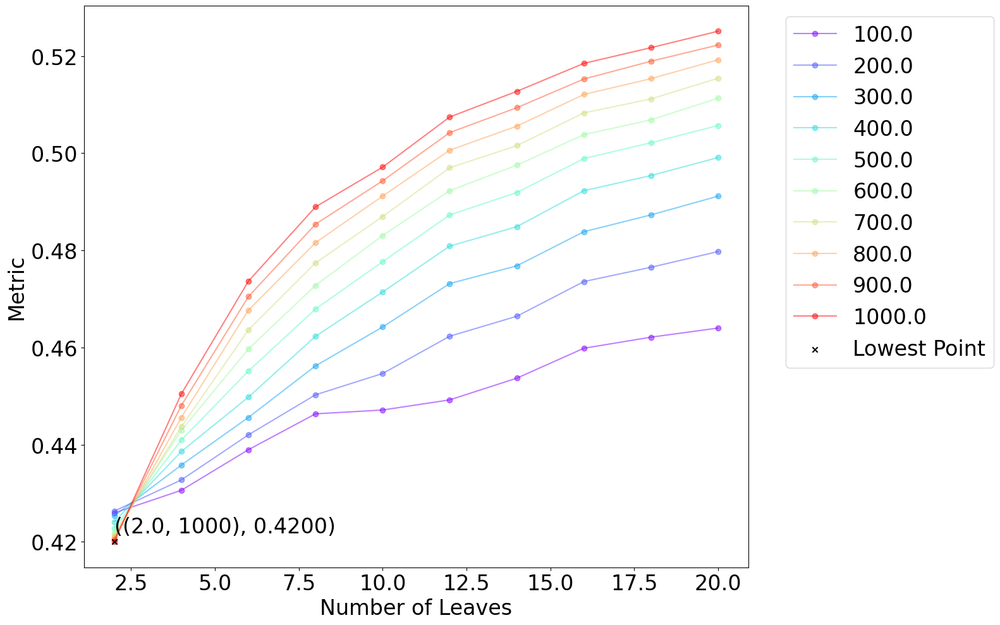

In [ ]:
F42=plotesti(param_easy,"param_easy_esti_df")

# **5 Con VCO chockoil temp**

In [ ]:
param_scores_df2=optimizer(train,a5)
print(param_scores_df2)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.063626   
1                 100                4          0.045790   
2                 100                6          0.039189   
3                 100                8          0.036022   
4                 100               10          0.033944   
..                ...              ...               ...   
95               1000               12          0.015262   
96               1000               14          0.013718   
97               1000               16          0.012368   
98               1000               18          0.011193   
99               1000               20          0.010200   

    mean_validation_score  
0                0.071076  
1                0.054079  
2                0.047475  
3                0.045503  
4                0.044409  
..                    ...  
95               0.040002  
96               0.040183  
97               0.040451  

In [ ]:
#plotscore(param_scores_df2,"param_scores_df2")

param_n_estimators            200
param_num_leaves                6
mean_train_score         0.034036
mean_validation_score    0.043668
Name: 12, dtype: object


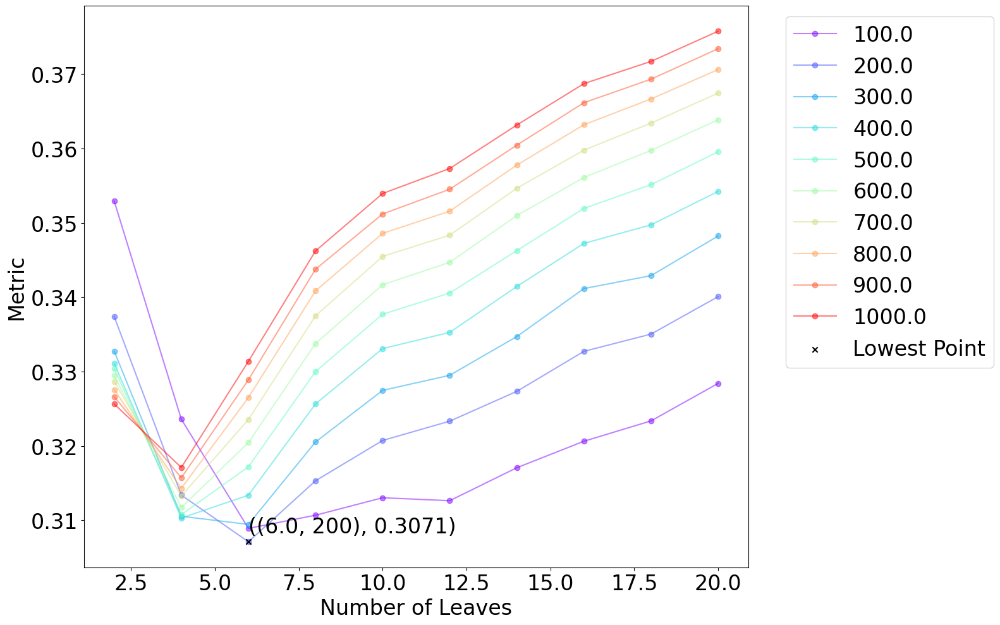

In [ ]:
F5=plotesti(param_scores_df2,"param_esti_df2")

**Part 1.3: Feature selection**

In [ ]:
top_k_features5, aggregated_scores5,sorted_indices5=featureop(F5[1],F5[0],train, a5)

Average Train RMSE+MAE: 0.03403574100054637
Average Validation RMSE+MAE: 0.04366796536796148


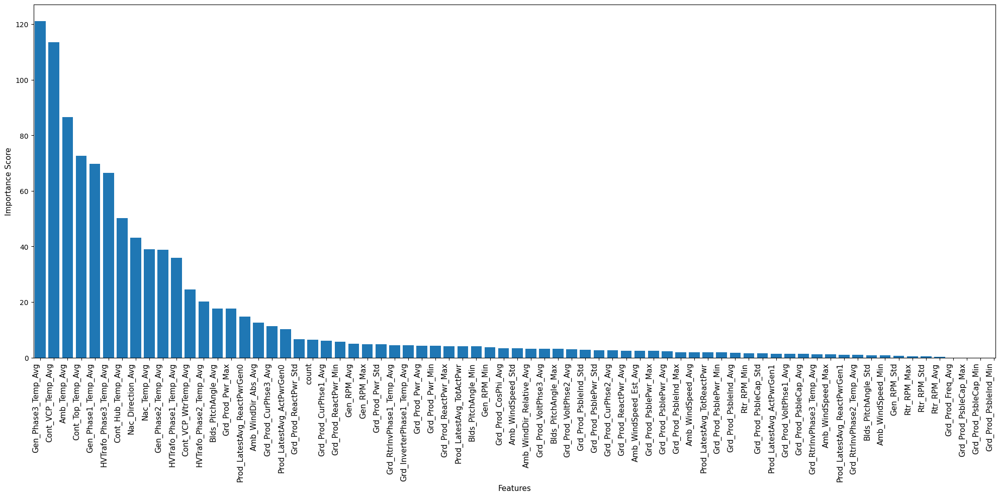

In [ ]:
plothis(top_k_features5, aggregated_scores5,sorted_indices5,"feature2")

In [ ]:
df3=df2[top_k_features5] #arrange columns by ranking
df3=mean_norm(df3)
df3

,Gen_Phase3_Temp_Avg,Cont_VCP_Temp_Avg,Amb_Temp_Avg,Cont_Top_Temp_Avg,Gen_Phase1_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Cont_Hub_Temp_Avg,Nac_Direction_Avg,Nac_Temp_Avg,Gen_Phase2_Temp_Avg,...,Blds_PitchAngle_Std,Amb_WindSpeed_Min,Gen_RPM_Std,Rtr_RPM_Max,Rtr_RPM_Std,Rtr_RPM_Avg,Grd_Prod_Freq_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleInd_Min
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.318966,0.433333,0.392857,0.357143,0.285714,0.154930,0.392857,0.608526,0.307692,0.313559,...,0.331828,0.000000,0.529583,0.678788,0.540541,0.590604,0.5,0.5010,0.0000,0.4990
2016-01-01 00:20:00,0.301724,0.433333,0.392857,0.357143,0.277778,0.154930,0.392857,0.594037,0.346154,0.296610,...,0.279910,0.036585,0.590572,0.745455,0.581081,0.456376,0.5,1.0000,0.0000,0.0000
2016-01-01 00:30:00,0.301724,0.433333,0.392857,0.357143,0.269841,0.154930,0.392857,0.619393,0.307692,0.296610,...,0.018059,0.036585,0.020654,0.696970,0.013514,0.744966,0.5,1.0000,0.0000,0.0000
2016-01-01 00:40:00,0.301724,0.433333,0.392857,0.357143,0.277778,0.154930,0.392857,0.619393,0.307692,0.305085,...,0.027088,0.048780,0.021869,0.709091,0.027027,0.744966,0.5,1.0000,0.0000,0.0000
2016-01-01 00:50:00,0.310345,0.433333,0.392857,0.357143,0.285714,0.154930,0.392857,0.616328,0.307692,0.313559,...,0.006772,0.292683,0.058681,0.787879,0.054054,0.791946,0.5,1.0000,0.7147,0.0000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,0.112069,0.366667,0.607143,0.357143,0.103175,0.239437,0.392857,0.354695,0.423077,0.110169,...,0.566591,0.463415,0.545742,0.903030,0.540541,0.093960,0.5,1.0000,0.0000,0.0000
2016-07-18 01:50:00,0.215517,0.366667,0.607143,0.321429,0.261905,0.253521,0.392857,0.354416,0.461538,0.237288,...,0.051919,0.304878,0.024055,0.933333,0.027027,0.993289,0.5,0.8904,0.4061,0.0000
2016-07-18 02:00:00,0.344828,0.400000,0.607143,0.357143,0.404762,0.295775,0.392857,0.330176,0.423077,0.372881,...,0.056433,0.280488,0.024298,0.939394,0.027027,1.000000,0.5,0.8208,0.4061,0.0000


In [ ]:
train2, test2 = train_test_split(df3, test_size=0.4,shuffle=False)

print(len(train2))
print(a1.shape)
train2

17179
(17179,)


,Gen_Phase3_Temp_Avg,Cont_VCP_Temp_Avg,Amb_Temp_Avg,Cont_Top_Temp_Avg,Gen_Phase1_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Cont_Hub_Temp_Avg,Nac_Direction_Avg,Nac_Temp_Avg,Gen_Phase2_Temp_Avg,...,Blds_PitchAngle_Std,Amb_WindSpeed_Min,Gen_RPM_Std,Rtr_RPM_Max,Rtr_RPM_Std,Rtr_RPM_Avg,Grd_Prod_Freq_Avg,Grd_Prod_PsbleCap_Max,Grd_Prod_PsbleCap_Min,Grd_Prod_PsbleInd_Min
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.318966,0.433333,0.392857,0.357143,0.285714,0.154930,0.392857,0.608526,0.307692,0.313559,...,0.331828,0.000000,0.529583,0.678788,0.540541,0.590604,0.5,0.501,0.0000,0.499
2016-01-01 00:20:00,0.301724,0.433333,0.392857,0.357143,0.277778,0.154930,0.392857,0.594037,0.346154,0.296610,...,0.279910,0.036585,0.590572,0.745455,0.581081,0.456376,0.5,1.000,0.0000,0.000
2016-01-01 00:30:00,0.301724,0.433333,0.392857,0.357143,0.269841,0.154930,0.392857,0.619393,0.307692,0.296610,...,0.018059,0.036585,0.020654,0.696970,0.013514,0.744966,0.5,1.000,0.0000,0.000
2016-01-01 00:40:00,0.301724,0.433333,0.392857,0.357143,0.277778,0.154930,0.392857,0.619393,0.307692,0.305085,...,0.027088,0.048780,0.021869,0.709091,0.027027,0.744966,0.5,1.000,0.0000,0.000
2016-01-01 00:50:00,0.310345,0.433333,0.392857,0.357143,0.285714,0.154930,0.392857,0.616328,0.307692,0.313559,...,0.006772,0.292683,0.058681,0.787879,0.054054,0.791946,0.5,1.000,0.7147,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.431034,0.400000,0.357143,0.250000,0.428571,0.211268,0.321429,0.368348,0.230769,0.432203,...,0.004515,0.585366,0.013729,0.903030,0.013514,0.986577,0.5,1.000,0.9007,0.000
2016-04-29 08:20:00,0.431034,0.433333,0.357143,0.250000,0.420635,0.225352,0.321429,0.390638,0.230769,0.432203,...,0.004515,0.365854,0.051999,0.903030,0.054054,0.966443,0.5,1.000,1.0000,0.000
2016-04-29 08:30:00,0.422414,0.433333,0.357143,0.285714,0.412698,0.225352,0.321429,0.391753,0.230769,0.423729,...,0.002257,0.317073,0.054307,0.896970,0.054054,0.959732,0.5,1.000,1.0000,0.000


In [ ]:
t5,v5 = fselect(top_k_features5, train2, a5, F5[1],F5[0])

Index when value does not change(from 0): 66
Mean_train_score 0.03403574100054637
Mean_validation_score 0.04367277785438003
Metric 0.30714873954127475


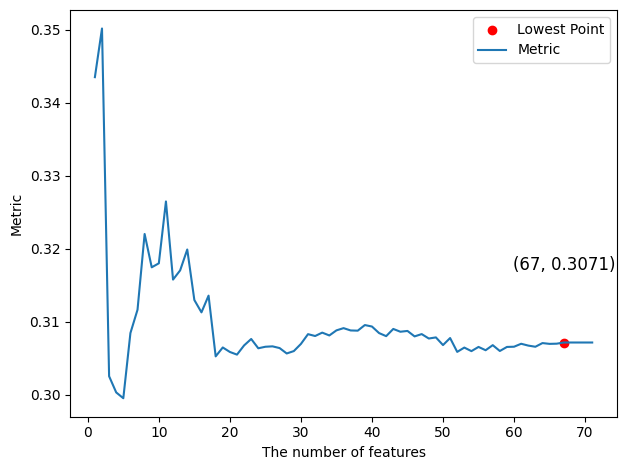

In [ ]:
F5_index=plotfs(t5,v5,"a2_complex_f")

**Part 2.3: Verification**

In [ ]:
#verify the selection of parameter
selected_columns = top_k_features5[:F5_index]
df = pd.DataFrame(train2, columns=selected_columns)
df

,Gen_Phase3_Temp_Avg,Cont_VCP_Temp_Avg,Amb_Temp_Avg,Cont_Top_Temp_Avg,Gen_Phase1_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Cont_Hub_Temp_Avg,Nac_Direction_Avg,Nac_Temp_Avg,Gen_Phase2_Temp_Avg,...,Grd_RtrInvPhase3_Temp_Avg,Amb_WindSpeed_Max,Prod_LatestAvg_ReactPwrGen1,Grd_RtrInvPhase2_Temp_Avg,Blds_PitchAngle_Std,Amb_WindSpeed_Min,Gen_RPM_Std,Rtr_RPM_Max,Rtr_RPM_Std,Rtr_RPM_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.318966,0.433333,0.392857,0.357143,0.285714,0.154930,0.392857,0.608526,0.307692,0.313559,...,0.347826,0.226306,0.312130,0.28,0.331828,0.000000,0.529583,0.678788,0.540541,0.590604
2016-01-01 00:20:00,0.301724,0.433333,0.392857,0.357143,0.277778,0.154930,0.392857,0.594037,0.346154,0.296610,...,0.347826,0.154739,0.320582,0.32,0.279910,0.036585,0.590572,0.745455,0.581081,0.456376
2016-01-01 00:30:00,0.301724,0.433333,0.392857,0.357143,0.269841,0.154930,0.392857,0.619393,0.307692,0.296610,...,0.391304,0.176015,0.261776,0.36,0.018059,0.036585,0.020654,0.696970,0.013514,0.744966
2016-01-01 00:40:00,0.301724,0.433333,0.392857,0.357143,0.277778,0.154930,0.392857,0.619393,0.307692,0.305085,...,0.391304,0.176015,0.272343,0.36,0.027088,0.048780,0.021869,0.709091,0.027027,0.744966
2016-01-01 00:50:00,0.310345,0.433333,0.392857,0.357143,0.285714,0.154930,0.392857,0.616328,0.307692,0.313559,...,0.391304,0.156673,0.258621,0.40,0.006772,0.292683,0.058681,0.787879,0.054054,0.791946
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.431034,0.400000,0.357143,0.250000,0.428571,0.211268,0.321429,0.368348,0.230769,0.432203,...,0.478261,0.263056,0.204445,0.48,0.004515,0.585366,0.013729,0.903030,0.013514,0.986577
2016-04-29 08:20:00,0.431034,0.433333,0.357143,0.250000,0.420635,0.225352,0.321429,0.390638,0.230769,0.432203,...,0.434783,0.257253,0.219992,0.44,0.004515,0.365854,0.051999,0.903030,0.054054,0.966443
2016-04-29 08:30:00,0.422414,0.433333,0.357143,0.285714,0.412698,0.225352,0.321429,0.391753,0.230769,0.423729,...,0.434783,0.313346,0.223570,0.44,0.002257,0.317073,0.054307,0.896970,0.054054,0.959732


In [ ]:
param_easy=optimizer(df,a5)

print(param_easy)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.063626   
1                 100                4          0.045790   
2                 100                6          0.039189   
3                 100                8          0.036019   
4                 100               10          0.033918   
..                ...              ...               ...   
95               1000               12          0.015261   
96               1000               14          0.013664   
97               1000               16          0.012301   
98               1000               18          0.011187   
99               1000               20          0.010193   

    mean_validation_score  
0                0.071076  
1                0.054079  
2                0.047479  
3                0.045515  
4                0.044275  
..                    ...  
95               0.039949  
96               0.039946  
97               0.040430  

param_n_estimators            200
param_num_leaves                6
mean_train_score         0.034036
mean_validation_score    0.043673
Name: 12, dtype: object


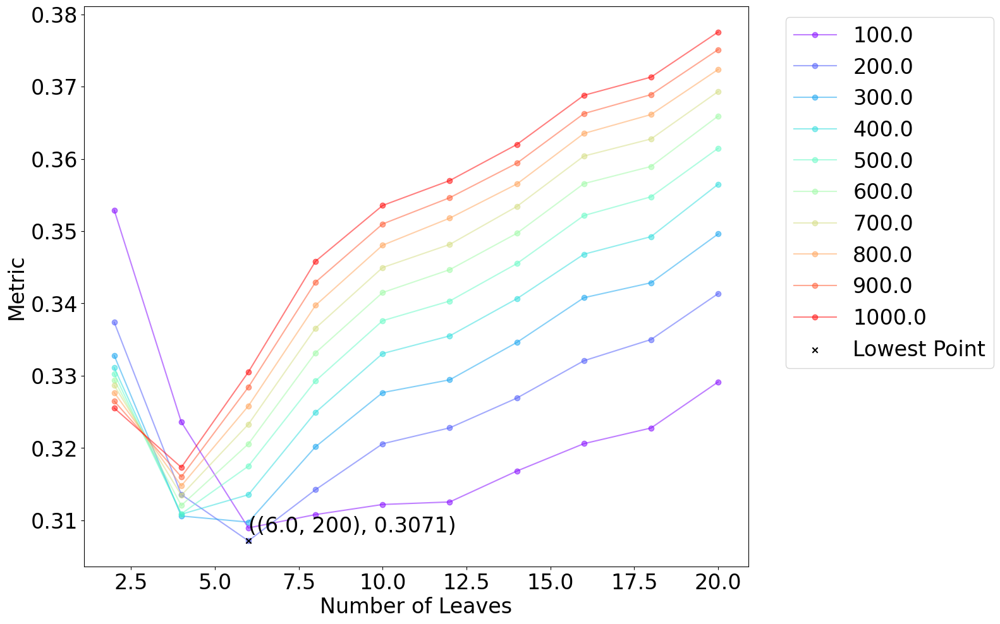

In [ ]:
F52=plotesti(param_easy,"param_easy_esti_df")

# **6 Grid busbar temp**

In [ ]:
param_scores_df2=optimizer(train,a6)
print(param_scores_df2)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.038144   
1                 100                4          0.031542   
2                 100                6          0.028179   
3                 100                8          0.026566   
4                 100               10          0.025658   
..                ...              ...               ...   
95               1000               12          0.014511   
96               1000               14          0.013236   
97               1000               16          0.012242   
98               1000               18          0.011224   
99               1000               20          0.010384   

    mean_validation_score  
0                0.040111  
1                0.034428  
2                0.031895  
3                0.030572  
4                0.030147  
..                    ...  
95               0.028336  
96               0.028456  
97               0.028507  

In [ ]:
#plotscore(param_scores_df2,"param_scores_df2")

param_n_estimators            200
param_num_leaves                4
mean_train_score         0.028603
mean_validation_score    0.031892
Name: 11, dtype: object


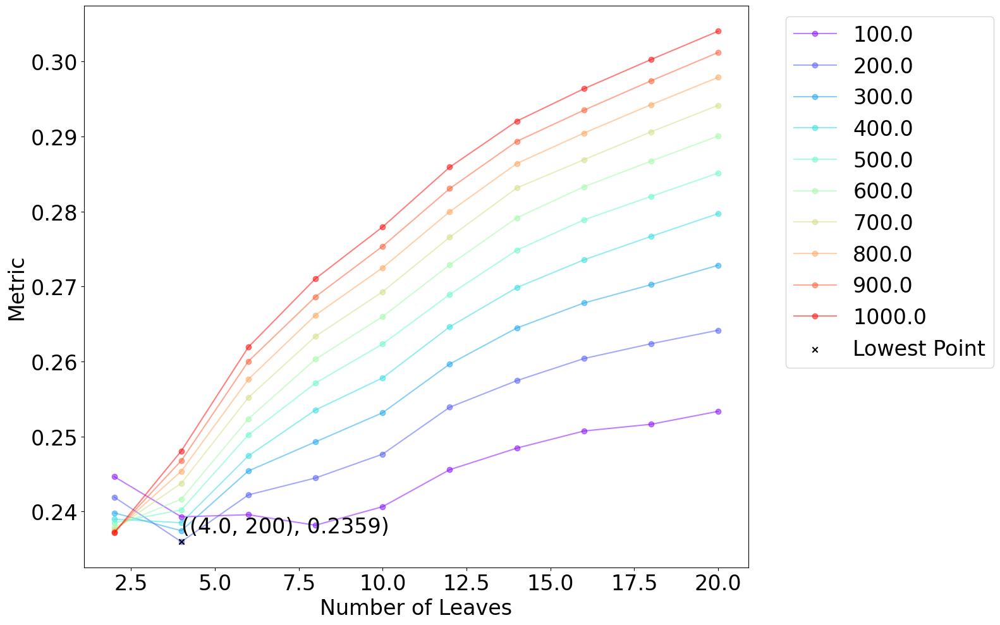

In [ ]:
F6=plotesti(param_scores_df2,"param_esti_df2")

**Part 1.3: Feature selection**

In [ ]:
top_k_features6, aggregated_scores6,sorted_indices6=featureop(F6[1],F6[0],train, a6)

Average Train RMSE+MAE: 0.028603035959827862
Average Validation RMSE+MAE: 0.03189246717228853


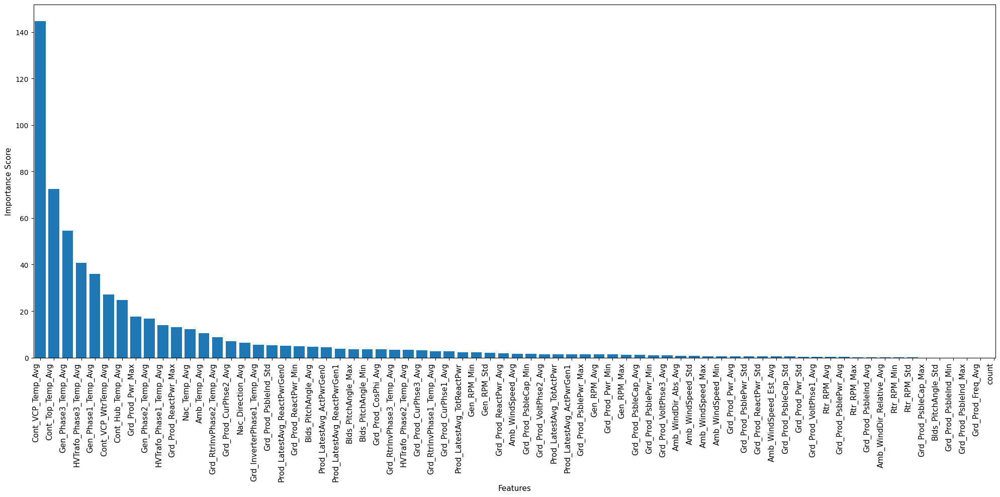

In [ ]:
plothis(top_k_features6, aggregated_scores6,sorted_indices6,"feature6")

In [ ]:
df3=df2[top_k_features6] #arrange columns by ranking
df3=mean_norm(df3)
df3

,Cont_VCP_Temp_Avg,Cont_Top_Temp_Avg,Gen_Phase3_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Gen_Phase1_Temp_Avg,Cont_VCP_WtrTemp_Avg,Cont_Hub_Temp_Avg,Grd_Prod_Pwr_Max,Gen_Phase2_Temp_Avg,HVTrafo_Phase1_Temp_Avg,...,Grd_Prod_PsbleInd_Avg,Amb_WindDir_Relative_Avg,Rtr_RPM_Min,Rtr_RPM_Std,Grd_Prod_PsbleCap_Max,Blds_PitchAngle_Std,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Max,Grd_Prod_Freq_Avg,count
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.433333,0.357143,0.318966,0.154930,0.285714,0.518519,0.392857,0.059302,0.313559,0.392157,...,0.9204,0.497636,0.000000,0.540541,0.5010,0.331828,0.4990,1.0000,0.5,0.000000
2016-01-01 00:20:00,0.433333,0.357143,0.301724,0.154930,0.277778,0.555556,0.392857,0.114442,0.296610,0.392157,...,0.6860,0.484562,0.129252,0.581081,1.0000,0.279910,0.0000,1.0000,0.5,0.011834
2016-01-01 00:30:00,0.433333,0.357143,0.301724,0.154930,0.269841,0.555556,0.392857,0.128893,0.296610,0.392157,...,0.3460,0.527399,0.727891,0.013514,1.0000,0.018059,0.0000,1.0000,0.5,0.000000
2016-01-01 00:40:00,0.433333,0.357143,0.301724,0.154930,0.277778,0.592593,0.392857,0.111215,0.305085,0.392157,...,0.5039,0.565508,0.734694,0.027027,1.0000,0.027088,0.0000,1.0000,0.5,0.000000
2016-01-01 00:50:00,0.433333,0.357143,0.310345,0.154930,0.285714,0.555556,0.392857,0.234262,0.313559,0.392157,...,0.0040,0.479555,0.755102,0.054054,1.0000,0.006772,0.0000,0.2853,0.5,0.005917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,0.366667,0.357143,0.112069,0.239437,0.103175,0.444444,0.392857,0.973202,0.110169,0.156863,...,0.9352,0.506259,0.000000,0.540541,1.0000,0.566591,0.0000,1.0000,0.5,0.029586
2016-07-18 01:50:00,0.366667,0.321429,0.215517,0.253521,0.261905,0.666667,0.392857,0.995136,0.237288,0.176471,...,0.2734,0.480668,0.986395,0.027027,0.8904,0.051919,0.0000,0.4167,0.5,0.023669
2016-07-18 02:00:00,0.400000,0.357143,0.344828,0.295775,0.404762,0.777778,0.392857,0.993640,0.372881,0.215686,...,0.3977,0.474270,0.979592,0.027027,0.8208,0.056433,0.0000,0.4167,0.5,0.005917


In [ ]:
train2, test2 = train_test_split(df3, test_size=0.4,shuffle=False)

print(len(train2))
print(a1.shape)
train2

17179
(17179,)


,Cont_VCP_Temp_Avg,Cont_Top_Temp_Avg,Gen_Phase3_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Gen_Phase1_Temp_Avg,Cont_VCP_WtrTemp_Avg,Cont_Hub_Temp_Avg,Grd_Prod_Pwr_Max,Gen_Phase2_Temp_Avg,HVTrafo_Phase1_Temp_Avg,...,Grd_Prod_PsbleInd_Avg,Amb_WindDir_Relative_Avg,Rtr_RPM_Min,Rtr_RPM_Std,Grd_Prod_PsbleCap_Max,Blds_PitchAngle_Std,Grd_Prod_PsbleInd_Min,Grd_Prod_PsbleInd_Max,Grd_Prod_Freq_Avg,count
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.433333,0.357143,0.318966,0.154930,0.285714,0.518519,0.392857,0.059302,0.313559,0.392157,...,0.9204,0.497636,0.000000,0.540541,0.501,0.331828,0.499,1.0000,0.5,0.000000
2016-01-01 00:20:00,0.433333,0.357143,0.301724,0.154930,0.277778,0.555556,0.392857,0.114442,0.296610,0.392157,...,0.6860,0.484562,0.129252,0.581081,1.000,0.279910,0.000,1.0000,0.5,0.011834
2016-01-01 00:30:00,0.433333,0.357143,0.301724,0.154930,0.269841,0.555556,0.392857,0.128893,0.296610,0.392157,...,0.3460,0.527399,0.727891,0.013514,1.000,0.018059,0.000,1.0000,0.5,0.000000
2016-01-01 00:40:00,0.433333,0.357143,0.301724,0.154930,0.277778,0.592593,0.392857,0.111215,0.305085,0.392157,...,0.5039,0.565508,0.734694,0.027027,1.000,0.027088,0.000,1.0000,0.5,0.000000
2016-01-01 00:50:00,0.433333,0.357143,0.310345,0.154930,0.285714,0.555556,0.392857,0.234262,0.313559,0.392157,...,0.0040,0.479555,0.755102,0.054054,1.000,0.006772,0.000,0.2853,0.5,0.005917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.400000,0.250000,0.431034,0.211268,0.428571,0.555556,0.321429,0.708774,0.432203,0.431373,...,0.0000,0.527399,0.979592,0.013514,1.000,0.004515,0.000,0.0000,0.5,0.000000
2016-04-29 08:20:00,0.433333,0.250000,0.431034,0.225352,0.420635,0.555556,0.321429,0.577027,0.432203,0.450980,...,0.0000,0.458136,0.870748,0.054054,1.000,0.004515,0.000,0.0000,0.5,0.000000
2016-04-29 08:30:00,0.433333,0.285714,0.422414,0.225352,0.412698,0.555556,0.321429,0.584464,0.423729,0.450980,...,0.0000,0.519054,0.891156,0.054054,1.000,0.002257,0.000,0.0000,0.5,0.005917


In [ ]:
t6,v6 = fselect(top_k_features6, train2, a6, F6[1],F6[0])

Index when value does not change(from 0): 64
Mean_train_score 0.028603035959827862
Mean_validation_score 0.031891858368199334
Metric 0.23593117284254544


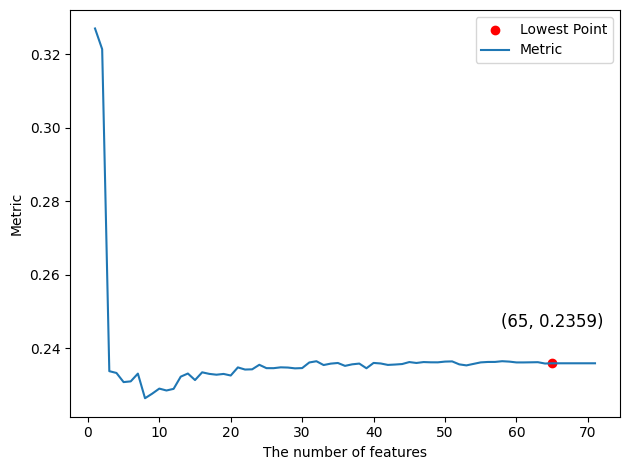

In [ ]:
F6_index=plotfs(t6,v6,"a2_complex_f")

**Part 2.3: Verification**

In [ ]:
#verify the selection of parameter
selected_columns = top_k_features6[:F6_index]
df = pd.DataFrame(train2, columns=selected_columns)
df

,Cont_VCP_Temp_Avg,Cont_Top_Temp_Avg,Gen_Phase3_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Gen_Phase1_Temp_Avg,Cont_VCP_WtrTemp_Avg,Cont_Hub_Temp_Avg,Grd_Prod_Pwr_Max,Gen_Phase2_Temp_Avg,HVTrafo_Phase1_Temp_Avg,...,Grd_Prod_PsbleCap_Std,Grd_Prod_Pwr_Std,Grd_Prod_VoltPhse1_Avg,Rtr_RPM_Avg,Grd_Prod_PsblePwr_Avg,Rtr_RPM_Max,Grd_Prod_PsbleInd_Avg,Amb_WindDir_Relative_Avg,Rtr_RPM_Min,Rtr_RPM_Std
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.433333,0.357143,0.318966,0.154930,0.285714,0.518519,0.392857,0.059302,0.313559,0.392157,...,0.249144,0.030173,0.380392,0.590604,0.01085,0.678788,0.9204,0.497636,0.000000,0.540541
2016-01-01 00:20:00,0.433333,0.357143,0.301724,0.154930,0.277778,0.555556,0.392857,0.114442,0.296610,0.392157,...,0.719839,0.077430,0.360784,0.456376,0.04445,0.745455,0.6860,0.484562,0.129252,0.581081
2016-01-01 00:30:00,0.433333,0.357143,0.301724,0.154930,0.269841,0.555556,0.392857,0.128893,0.296610,0.392157,...,0.495065,0.053852,0.294118,0.744966,0.06765,0.696970,0.3460,0.527399,0.727891,0.013514
2016-01-01 00:40:00,0.433333,0.357143,0.301724,0.154930,0.277778,0.592593,0.392857,0.111215,0.305085,0.392157,...,0.609668,0.065841,0.286275,0.744966,0.05135,0.709091,0.5039,0.565508,0.734694,0.027027
2016-01-01 00:50:00,0.433333,0.357143,0.310345,0.154930,0.285714,0.555556,0.392857,0.234262,0.313559,0.392157,...,0.055186,0.069238,0.262745,0.791946,0.16035,0.787879,0.0040,0.479555,0.755102,0.054054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.400000,0.250000,0.431034,0.211268,0.428571,0.555556,0.321429,0.708774,0.432203,0.431373,...,0.018127,0.093216,0.235294,0.986577,0.61050,0.903030,0.0000,0.527399,0.979592,0.013514
2016-04-29 08:20:00,0.433333,0.250000,0.431034,0.225352,0.420635,0.555556,0.321429,0.577027,0.432203,0.450980,...,0.000000,0.141872,0.317647,0.966443,0.45315,0.903030,0.0000,0.458136,0.870748,0.054054
2016-04-29 08:30:00,0.433333,0.285714,0.422414,0.225352,0.412698,0.555556,0.321429,0.584464,0.423729,0.450980,...,0.000000,0.142672,0.341176,0.959732,0.44335,0.896970,0.0000,0.519054,0.891156,0.054054


In [ ]:
param_easy=optimizer(df,a6)

print(param_easy)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.038144   
1                 100                4          0.031542   
2                 100                6          0.028179   
3                 100                8          0.026570   
4                 100               10          0.025651   
..                ...              ...               ...   
95               1000               12          0.014493   
96               1000               14          0.013294   
97               1000               16          0.012254   
98               1000               18          0.011264   
99               1000               20          0.010426   

    mean_validation_score  
0                0.040111  
1                0.034426  
2                0.031896  
3                0.030564  
4                0.030115  
..                    ...  
95               0.028303  
96               0.028425  
97               0.028433  

In [ ]:
#plotscore(param_easy,"param_easy")

param_n_estimators            200
param_num_leaves                4
mean_train_score         0.028603
mean_validation_score    0.031892
Name: 11, dtype: object


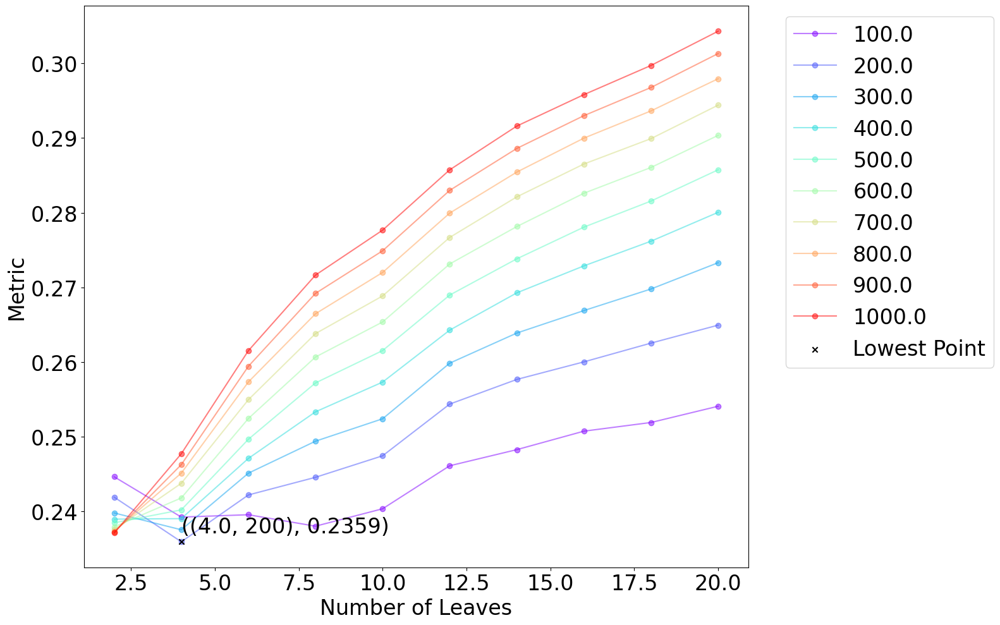

In [ ]:
F62=plotesti(param_easy,"param_easy_esti_df")

# **7 Gen bear2 temp**

In [ ]:
param_scores_df2=optimizer(train,a7)
print(param_scores_df2)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.101922   
1                 100                4          0.093515   
2                 100                6          0.087407   
3                 100                8          0.082800   
4                 100               10          0.078708   
..                ...              ...               ...   
95               1000               12          0.033915   
96               1000               14          0.029891   
97               1000               16          0.026476   
98               1000               18          0.023926   
99               1000               20          0.021488   

    mean_validation_score  
0                0.115889  
1                0.114860  
2                0.113948  
3                0.113471  
4                0.114476  
..                    ...  
95               0.118211  
96               0.117937  
97               0.118216  

In [ ]:
#plotscore(param_scores_df2,"param_scores_df2")

param_n_estimators            100
param_num_leaves                2
mean_train_score         0.101922
mean_validation_score    0.115889
Name: 0, dtype: object


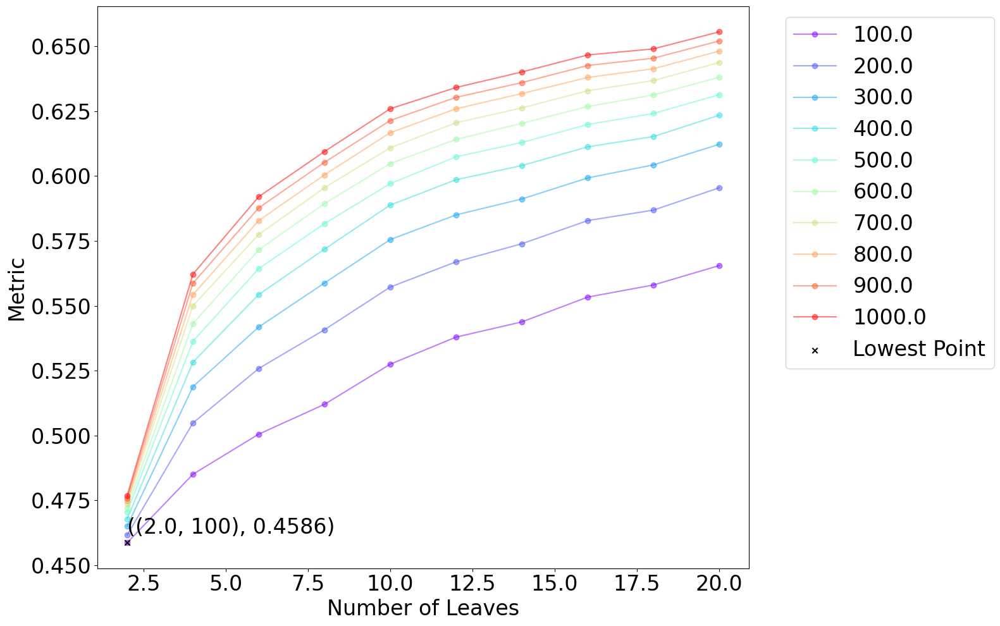

In [ ]:
F7=plotesti(param_scores_df2,"param_esti_df2")

**Part 1.3: Feature selection**

In [ ]:
top_k_features7, aggregated_scores7,sorted_indices7=featureop(F7[1],F7[0],train, a7)

Average Train RMSE+MAE: 0.10192165839329452
Average Validation RMSE+MAE: 0.11588935265514891


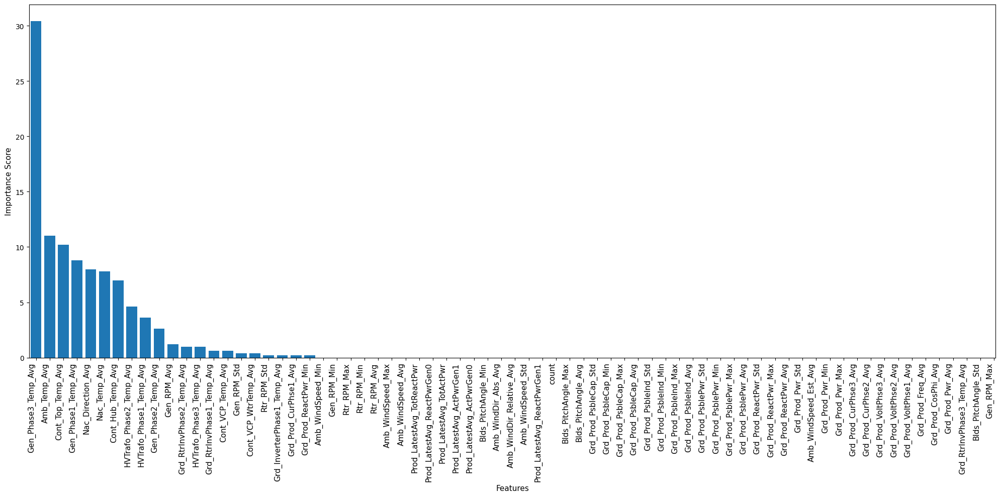

In [ ]:
plothis(top_k_features7, aggregated_scores7,sorted_indices7,"feature7")

In [ ]:
df3=df2[top_k_features7] #arrange columns by ranking
df3=mean_norm(df3)
df3

,Gen_Phase3_Temp_Avg,Amb_Temp_Avg,Cont_Top_Temp_Avg,Gen_Phase1_Temp_Avg,Nac_Direction_Avg,Nac_Temp_Avg,Cont_Hub_Temp_Avg,HVTrafo_Phase2_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,...,Grd_Prod_CurPhse2_Avg,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_CosPhi_Avg,Grd_Prod_Pwr_Avg,Grd_RtrInvPhase3_Temp_Avg,Blds_PitchAngle_Std,Gen_RPM_Max
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.318966,0.392857,0.357143,0.285714,0.608526,0.307692,0.392857,0.245614,0.392157,0.313559,...,0.023317,0.342020,0.392996,0.380392,0.5,0.625,0.018540,0.347826,0.331828,0.659474
2016-01-01 00:20:00,0.301724,0.392857,0.357143,0.277778,0.594037,0.346154,0.392857,0.245614,0.392157,0.296610,...,0.053230,0.319218,0.385214,0.360784,0.5,0.625,0.042653,0.347826,0.279910,0.725042
2016-01-01 00:30:00,0.301724,0.392857,0.357143,0.269841,0.619393,0.307692,0.392857,0.245614,0.392157,0.296610,...,0.093329,0.257329,0.291829,0.294118,0.5,0.750,0.080473,0.391304,0.018059,0.679389
2016-01-01 00:40:00,0.301724,0.392857,0.357143,0.277778,0.619393,0.307692,0.392857,0.245614,0.392157,0.305085,...,0.075369,0.254072,0.284047,0.286275,0.5,0.625,0.062327,0.391304,0.027088,0.686824
2016-01-01 00:50:00,0.310345,0.392857,0.357143,0.285714,0.616328,0.307692,0.392857,0.245614,0.392157,0.313559,...,0.173880,0.185668,0.264591,0.262745,0.5,1.000,0.171499,0.391304,0.006772,0.760503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,0.112069,0.607143,0.357143,0.103175,0.354695,0.423077,0.392857,0.157895,0.156863,0.110169,...,0.039863,0.407166,0.361868,0.364706,0.5,0.750,0.044280,0.173913,0.566591,0.872348
2016-07-18 01:50:00,0.215517,0.607143,0.321429,0.261905,0.354416,0.461538,0.392857,0.175439,0.176471,0.237288,...,0.956780,0.384365,0.245136,0.262745,0.5,1.000,0.960454,0.739130,0.051919,0.914777
2016-07-18 02:00:00,0.344828,0.607143,0.357143,0.404762,0.330176,0.423077,0.392857,0.228070,0.215686,0.372881,...,0.992169,0.368078,0.221790,0.239216,0.5,1.000,0.995464,0.826087,0.056433,0.913478


In [ ]:
train2, test2 = train_test_split(df3, test_size=0.4,shuffle=False)

print(len(train2))
print(a1.shape)
train2

17179
(17179,)


,Gen_Phase3_Temp_Avg,Amb_Temp_Avg,Cont_Top_Temp_Avg,Gen_Phase1_Temp_Avg,Nac_Direction_Avg,Nac_Temp_Avg,Cont_Hub_Temp_Avg,HVTrafo_Phase2_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,...,Grd_Prod_CurPhse2_Avg,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_CosPhi_Avg,Grd_Prod_Pwr_Avg,Grd_RtrInvPhase3_Temp_Avg,Blds_PitchAngle_Std,Gen_RPM_Max
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.318966,0.392857,0.357143,0.285714,0.608526,0.307692,0.392857,0.245614,0.392157,0.313559,...,0.023317,0.342020,0.392996,0.380392,0.5,0.625,0.018540,0.347826,0.331828,0.659474
2016-01-01 00:20:00,0.301724,0.392857,0.357143,0.277778,0.594037,0.346154,0.392857,0.245614,0.392157,0.296610,...,0.053230,0.319218,0.385214,0.360784,0.5,0.625,0.042653,0.347826,0.279910,0.725042
2016-01-01 00:30:00,0.301724,0.392857,0.357143,0.269841,0.619393,0.307692,0.392857,0.245614,0.392157,0.296610,...,0.093329,0.257329,0.291829,0.294118,0.5,0.750,0.080473,0.391304,0.018059,0.679389
2016-01-01 00:40:00,0.301724,0.392857,0.357143,0.277778,0.619393,0.307692,0.392857,0.245614,0.392157,0.305085,...,0.075369,0.254072,0.284047,0.286275,0.5,0.625,0.062327,0.391304,0.027088,0.686824
2016-01-01 00:50:00,0.310345,0.392857,0.357143,0.285714,0.616328,0.307692,0.392857,0.245614,0.392157,0.313559,...,0.173880,0.185668,0.264591,0.262745,0.5,1.000,0.171499,0.391304,0.006772,0.760503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.431034,0.357143,0.250000,0.428571,0.368348,0.230769,0.321429,0.280702,0.431373,0.432203,...,0.614026,0.345277,0.237354,0.235294,0.5,1.000,0.615533,0.478261,0.004515,0.875884
2016-04-29 08:20:00,0.431034,0.357143,0.250000,0.420635,0.390638,0.230769,0.321429,0.298246,0.450980,0.432203,...,0.457575,0.407166,0.315175,0.317647,0.5,1.000,0.460602,0.434783,0.004515,0.871932
2016-04-29 08:30:00,0.422414,0.357143,0.285714,0.412698,0.391753,0.230769,0.321429,0.298246,0.450980,0.423729,...,0.446211,0.429967,0.342412,0.341176,0.5,1.000,0.450641,0.434783,0.002257,0.869696


In [ ]:
t7,v7 = fselect(top_k_features7, train2, a7, 4,10)

Index when value does not change(from 0): 18
Mean_train_score 0.17452278870893304
Mean_validation_score 0.18086577594431072
Metric 0.5049260445787247


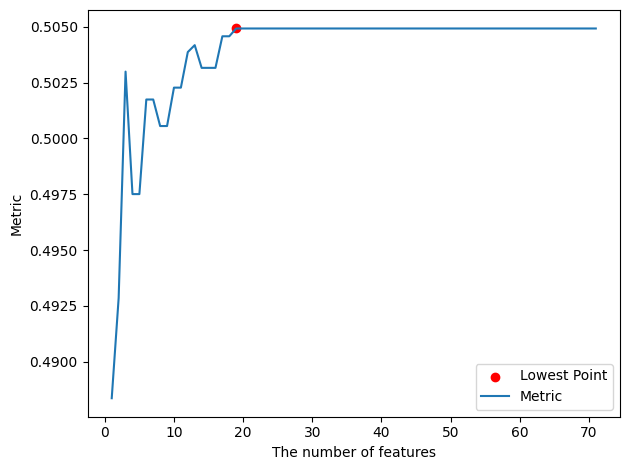

In [ ]:
F7_index=plotfs(t7,v7,"a7_complex_f")

**Part 2.3: Verification**

In [ ]:
#verify the selection of parameter
selected_columns = top_k_features7[:F7_index]
df = pd.DataFrame(train2, columns=selected_columns)
df

,Gen_Phase3_Temp_Avg,Amb_Temp_Avg,Cont_Top_Temp_Avg,Gen_Phase1_Temp_Avg,Nac_Direction_Avg,Nac_Temp_Avg,Cont_Hub_Temp_Avg,HVTrafo_Phase2_Temp_Avg,HVTrafo_Phase1_Temp_Avg,Gen_Phase2_Temp_Avg,Gen_RPM_Avg,Grd_RtrInvPhase2_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Grd_RtrInvPhase1_Temp_Avg,Cont_VCP_Temp_Avg,Gen_RPM_Std,Cont_VCP_WtrTemp_Avg,Rtr_RPM_Std,Grd_InverterPhase1_Temp_Avg
Timestamp,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.318966,0.392857,0.357143,0.285714,0.608526,0.307692,0.392857,0.245614,0.392157,0.313559,0.593822,0.28,0.154930,0.32,0.433333,0.529583,0.518519,0.540541,0.375000
2016-01-01 00:20:00,0.301724,0.392857,0.357143,0.277778,0.594037,0.346154,0.392857,0.245614,0.392157,0.296610,0.459756,0.32,0.154930,0.36,0.433333,0.590572,0.555556,0.581081,0.416667
2016-01-01 00:30:00,0.301724,0.392857,0.357143,0.269841,0.619393,0.307692,0.392857,0.245614,0.392157,0.296610,0.746718,0.36,0.154930,0.36,0.433333,0.020654,0.555556,0.013514,0.416667
2016-01-01 00:40:00,0.301724,0.392857,0.357143,0.277778,0.619393,0.307692,0.392857,0.245614,0.392157,0.305085,0.747075,0.36,0.154930,0.40,0.433333,0.021869,0.592593,0.027027,0.416667
2016-01-01 00:50:00,0.310345,0.392857,0.357143,0.285714,0.616328,0.307692,0.392857,0.245614,0.392157,0.313559,0.789130,0.40,0.154930,0.40,0.433333,0.058681,0.555556,0.054054,0.416667
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.431034,0.357143,0.250000,0.428571,0.368348,0.230769,0.321429,0.280702,0.431373,0.432203,0.989070,0.48,0.211268,0.48,0.400000,0.013729,0.555556,0.013514,0.500000
2016-04-29 08:20:00,0.431034,0.357143,0.250000,0.420635,0.390638,0.230769,0.321429,0.298246,0.450980,0.432203,0.965132,0.44,0.225352,0.44,0.433333,0.051999,0.555556,0.054054,0.458333
2016-04-29 08:30:00,0.422414,0.357143,0.285714,0.412698,0.391753,0.230769,0.321429,0.298246,0.450980,0.423729,0.957054,0.44,0.225352,0.44,0.433333,0.054307,0.555556,0.054054,0.416667


In [ ]:
param_easy=optimizer(df,a7)

print(param_easy)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.101919   
1                 100                4          0.093542   
2                 100                6          0.087273   
3                 100                8          0.082614   
4                 100               10          0.078611   
..                ...              ...               ...   
95               1000               12          0.035929   
96               1000               14          0.032280   
97               1000               16          0.029551   
98               1000               18          0.027306   
99               1000               20          0.025164   

    mean_validation_score  
0                0.115875  
1                0.114381  
2                0.114003  
3                0.113595  
4                0.114346  
..                    ...  
95               0.118920  
96               0.118806  
97               0.118987  

In [ ]:
#plotscore(param_easy,"param_easy")

param_n_estimators            100
param_num_leaves                2
mean_train_score         0.101919
mean_validation_score    0.115875
Name: 0, dtype: object


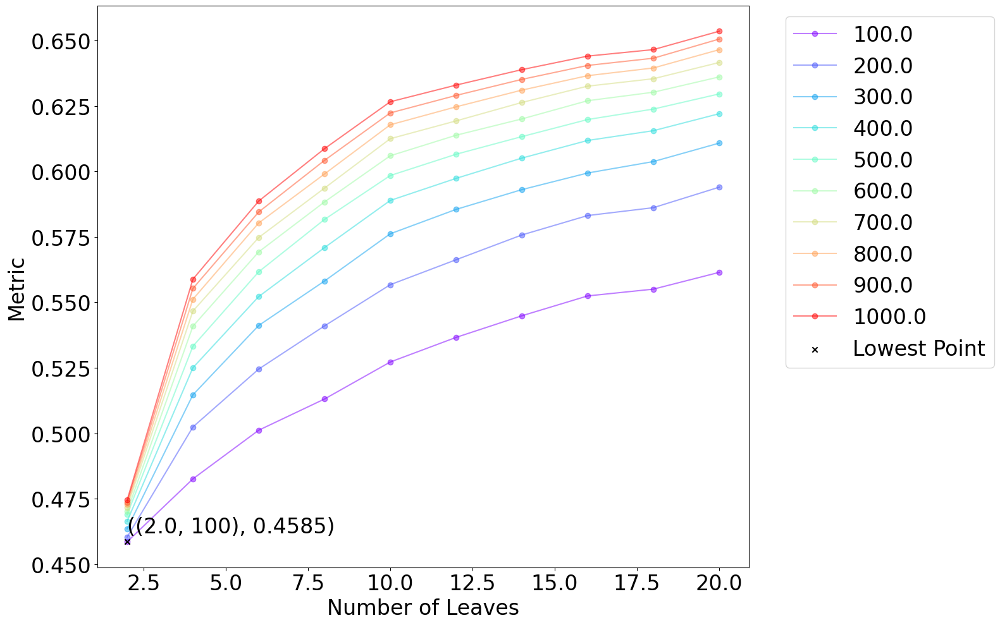

In [ ]:
F72=plotesti(param_easy,"param_easy_esti_df")

# **8 Spin temp**

In [ ]:
param_scores_df2=optimizer(train,a8)
print(param_scores_df2)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.054209   
1                 100                4          0.044805   
2                 100                6          0.041548   
3                 100                8          0.039506   
4                 100               10          0.037966   
..                ...              ...               ...   
95               1000               12          0.021394   
96               1000               14          0.019481   
97               1000               16          0.017895   
98               1000               18          0.016503   
99               1000               20          0.015190   

    mean_validation_score  
0                0.060873  
1                0.050971  
2                0.048748  
3                0.047148  
4                0.046702  
..                    ...  
95               0.045917  
96               0.046174  
97               0.046069  

In [ ]:
#plotscore(param_scores_df2,"param_scores_df2")

param_n_estimators            100
param_num_leaves                4
mean_train_score         0.044805
mean_validation_score    0.050971
Name: 1, dtype: object


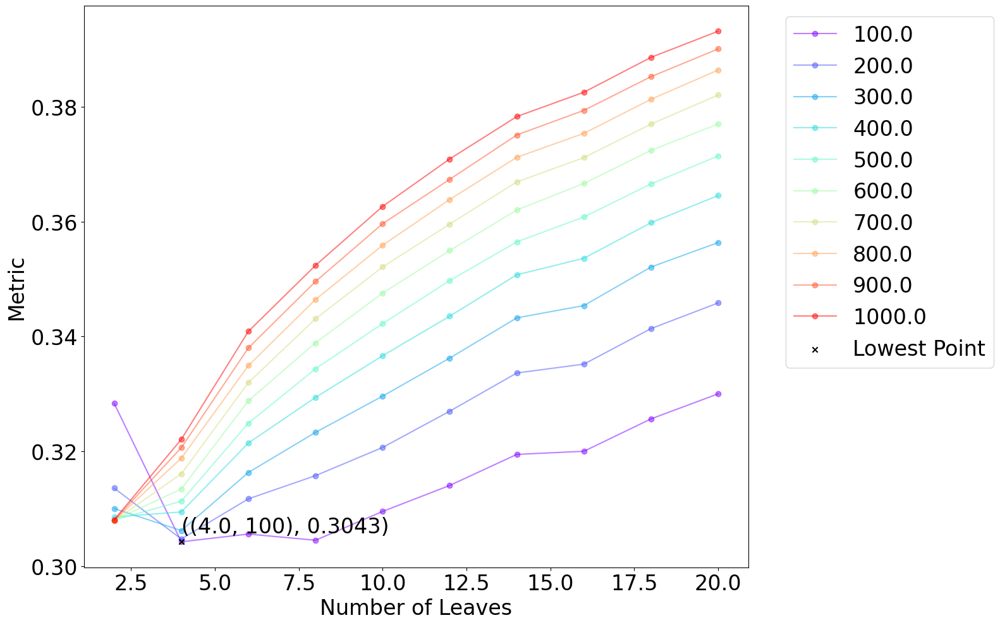

In [ ]:
F8=plotesti(param_scores_df2,"param_esti_df2")

**Part 1.3: Feature selection**

In [ ]:
top_k_features8, aggregated_scores8,sorted_indices8=featureop(F8[1],F8[0],train, a8)

Average Train RMSE+MAE: 0.04480499266406793
Average Validation RMSE+MAE: 0.05097120953118983


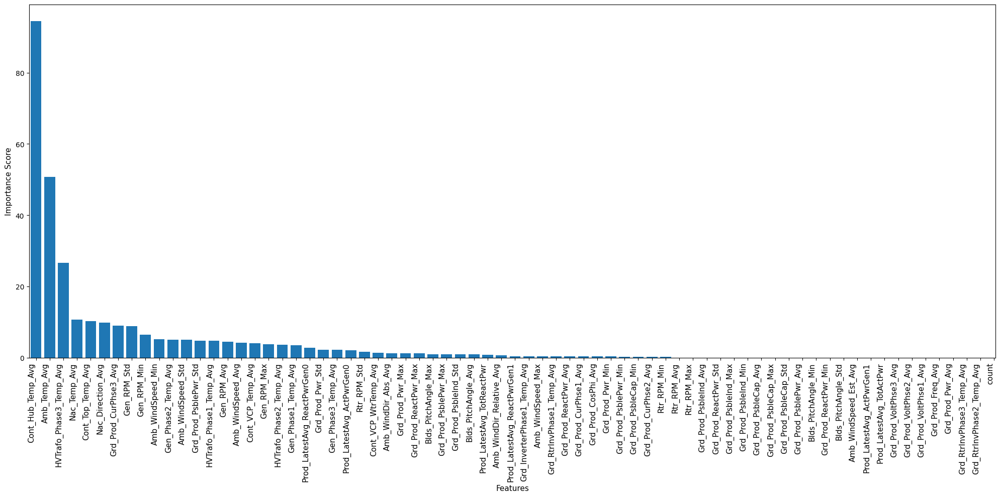

In [ ]:
plothis(top_k_features8, aggregated_scores8,sorted_indices8,"feature8")

In [ ]:
df3=df2[top_k_features8] #arrange columns by ranking
df3=mean_norm(df3)
df3

,Cont_Hub_Temp_Avg,Amb_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Nac_Temp_Avg,Cont_Top_Temp_Avg,Nac_Direction_Avg,Grd_Prod_CurPhse3_Avg,Gen_RPM_Std,Gen_RPM_Min,Amb_WindSpeed_Min,...,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_TotActPwr,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_Pwr_Avg,Grd_RtrInvPhase3_Temp_Avg,Grd_RtrInvPhase2_Temp_Avg,count
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.608526,0.018914,0.529583,0.056334,0.000000,...,0.008548,0.018674,0.342020,0.392996,0.380392,0.5,0.018540,0.347826,0.28,0.000000
2016-01-01 00:20:00,0.392857,0.392857,0.154930,0.346154,0.357143,0.594037,0.050338,0.590572,0.133015,0.036585,...,0.032485,0.042221,0.319218,0.385214,0.360784,0.5,0.042653,0.347826,0.32,0.011834
2016-01-01 00:30:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.619393,0.080685,0.020654,0.732037,0.036585,...,0.068943,0.080542,0.257329,0.291829,0.294118,0.5,0.080473,0.391304,0.36,0.000000
2016-01-01 00:40:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.619393,0.063626,0.021869,0.739102,0.048780,...,0.050715,0.062319,0.254072,0.284047,0.286275,0.5,0.062327,0.391304,0.36,0.000000
2016-01-01 00:50:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.616328,0.167834,0.058681,0.754438,0.292683,...,0.160802,0.171256,0.185668,0.264591,0.262745,0.5,0.171499,0.391304,0.40,0.005917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,0.392857,0.607143,0.239437,0.423077,0.357143,0.354695,0.041061,0.545742,0.000000,0.463415,...,0.032934,0.040909,0.407166,0.361868,0.364706,0.5,0.044280,0.173913,0.16,0.029586
2016-07-18 01:50:00,0.392857,0.607143,0.253521,0.461538,0.321429,0.354416,0.954869,0.024055,0.982732,0.304878,...,0.958123,0.958645,0.384365,0.245136,0.262745,0.5,0.960454,0.739130,0.72,0.023669
2016-07-18 02:00:00,0.392857,0.607143,0.295775,0.423077,0.357143,0.330176,0.991261,0.024298,0.979230,0.280488,...,0.993893,0.993969,0.368078,0.221790,0.239216,0.5,0.995464,0.826087,0.84,0.005917


In [ ]:
train2, test2 = train_test_split(df3, test_size=0.4,shuffle=False)

print(len(train2))
print(a1.shape)
train2

17179
(17179,)


,Cont_Hub_Temp_Avg,Amb_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Nac_Temp_Avg,Cont_Top_Temp_Avg,Nac_Direction_Avg,Grd_Prod_CurPhse3_Avg,Gen_RPM_Std,Gen_RPM_Min,Amb_WindSpeed_Min,...,Prod_LatestAvg_ActPwrGen1,Prod_LatestAvg_TotActPwr,Grd_Prod_VoltPhse3_Avg,Grd_Prod_VoltPhse2_Avg,Grd_Prod_VoltPhse1_Avg,Grd_Prod_Freq_Avg,Grd_Prod_Pwr_Avg,Grd_RtrInvPhase3_Temp_Avg,Grd_RtrInvPhase2_Temp_Avg,count
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.608526,0.018914,0.529583,0.056334,0.000000,...,0.008548,0.018674,0.342020,0.392996,0.380392,0.5,0.018540,0.347826,0.28,0.000000
2016-01-01 00:20:00,0.392857,0.392857,0.154930,0.346154,0.357143,0.594037,0.050338,0.590572,0.133015,0.036585,...,0.032485,0.042221,0.319218,0.385214,0.360784,0.5,0.042653,0.347826,0.32,0.011834
2016-01-01 00:30:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.619393,0.080685,0.020654,0.732037,0.036585,...,0.068943,0.080542,0.257329,0.291829,0.294118,0.5,0.080473,0.391304,0.36,0.000000
2016-01-01 00:40:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.619393,0.063626,0.021869,0.739102,0.048780,...,0.050715,0.062319,0.254072,0.284047,0.286275,0.5,0.062327,0.391304,0.36,0.000000
2016-01-01 00:50:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.616328,0.167834,0.058681,0.754438,0.292683,...,0.160802,0.171256,0.185668,0.264591,0.262745,0.5,0.171499,0.391304,0.40,0.005917
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.321429,0.357143,0.211268,0.230769,0.250000,0.368348,0.611241,0.013729,0.981041,0.585366,...,0.609728,0.614590,0.345277,0.237354,0.235294,0.5,0.615533,0.478261,0.48,0.000000
2016-04-29 08:20:00,0.321429,0.357143,0.225352,0.230769,0.250000,0.390638,0.452385,0.051999,0.875015,0.365854,...,0.453686,0.460492,0.407166,0.315175,0.317647,0.5,0.460602,0.434783,0.44,0.000000
2016-04-29 08:30:00,0.321429,0.357143,0.225352,0.230769,0.285714,0.391753,0.441492,0.054307,0.893250,0.317073,...,0.443821,0.450750,0.429967,0.342412,0.341176,0.5,0.450641,0.434783,0.44,0.005917


In [ ]:
t8,v8 = fselect(top_k_features8, train2, a8, 4,100)

Index when value does not change(from 0): 46
Mean_train_score 0.04480499266406793
Mean_validation_score 0.05097120953118983
Metric 0.30429330624938006


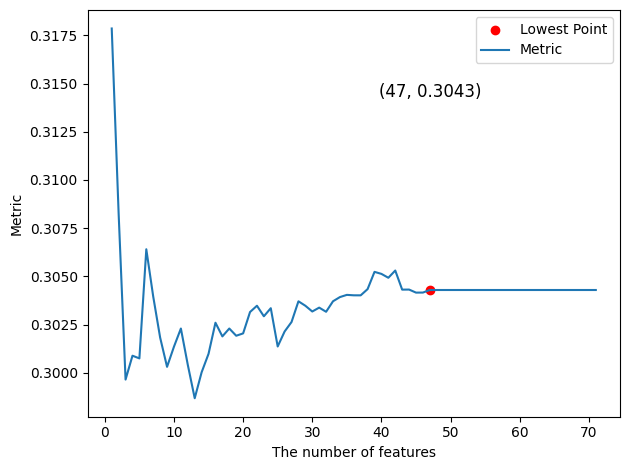

In [ ]:
F8_index=plotfs(t8,v8,"a8_complex_f")

**Part 2.3: Verification**

In [ ]:
#verify the selection of parameter
selected_columns = top_k_features8[:F8_index]
df = pd.DataFrame(train2, columns=selected_columns)
df

,Cont_Hub_Temp_Avg,Amb_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Nac_Temp_Avg,Cont_Top_Temp_Avg,Nac_Direction_Avg,Grd_Prod_CurPhse3_Avg,Gen_RPM_Std,Gen_RPM_Min,Amb_WindSpeed_Min,...,Amb_WindSpeed_Max,Grd_RtrInvPhase1_Temp_Avg,Grd_Prod_ReactPwr_Avg,Grd_Prod_CurPhse1_Avg,Grd_Prod_CosPhi_Avg,Grd_Prod_Pwr_Min,Grd_Prod_PsblePwr_Min,Grd_Prod_PsbleCap_Min,Grd_Prod_CurPhse2_Avg,Rtr_RPM_Min
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.608526,0.018914,0.529583,0.056334,0.000000,...,0.226306,0.32,0.308740,0.019618,0.625,0.006988,0.00000,0.0000,0.023317,0.000000
2016-01-01 00:20:00,0.392857,0.392857,0.154930,0.346154,0.357143,0.594037,0.050338,0.590572,0.133015,0.036585,...,0.154739,0.36,0.318638,0.045954,0.625,0.008991,0.00000,0.0000,0.053230,0.129252
2016-01-01 00:30:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.619393,0.080685,0.020654,0.732037,0.036585,...,0.176015,0.36,0.261776,0.075382,0.750,0.012119,0.00000,0.0000,0.093329,0.727891
2016-01-01 00:40:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.619393,0.063626,0.021869,0.739102,0.048780,...,0.176015,0.40,0.272025,0.061471,0.625,0.001124,0.00000,0.0000,0.075369,0.734694
2016-01-01 00:50:00,0.392857,0.392857,0.154930,0.307692,0.357143,0.616328,0.167834,0.058681,0.754438,0.292683,...,0.156673,0.40,0.258617,0.154271,1.000,0.094507,0.07295,0.7147,0.173880,0.755102
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.321429,0.357143,0.211268,0.230769,0.250000,0.368348,0.611241,0.013729,0.981041,0.585366,...,0.263056,0.48,0.204423,0.604007,1.000,0.512998,0.49385,0.9007,0.614026,0.979592
2016-04-29 08:20:00,0.321429,0.357143,0.225352,0.230769,0.250000,0.390638,0.452385,0.051999,0.875015,0.365854,...,0.257253,0.44,0.220007,0.445217,1.000,0.291390,0.25610,1.0000,0.457575,0.870748
2016-04-29 08:30:00,0.321429,0.357143,0.225352,0.230769,0.285714,0.391753,0.441492,0.054307,0.893250,0.317073,...,0.313346,0.44,0.223657,0.434397,1.000,0.269351,0.24635,1.0000,0.446211,0.891156


In [ ]:
param_easy=optimizer(df,a8)

print(param_easy)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.054209   
1                 100                4          0.044805   
2                 100                6          0.041510   
3                 100                8          0.039470   
4                 100               10          0.037958   
..                ...              ...               ...   
95               1000               12          0.021820   
96               1000               14          0.020030   
97               1000               16          0.018538   
98               1000               18          0.017102   
99               1000               20          0.015912   

    mean_validation_score  
0                0.060873  
1                0.050971  
2                0.048618  
3                0.047244  
4                0.046948  
..                    ...  
95               0.045612  
96               0.045769  
97               0.045985  

In [ ]:
#plotscore(param_easy,"param_easy")

param_n_estimators            200
param_num_leaves                4
mean_train_score         0.041375
mean_validation_score    0.048432
Name: 11, dtype: object


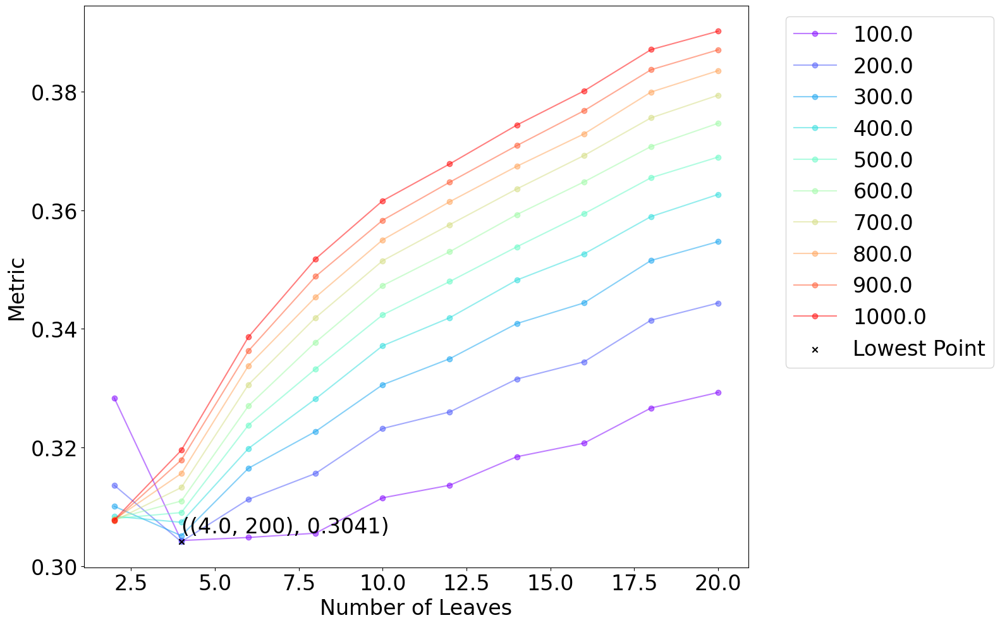

In [ ]:
F82=plotesti(param_easy,"param_easy_esti_df")

# **9 Gen slip ring temp**

In [ ]:
param_scores_df2=optimizer(train,a9)
print(param_scores_df2)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.037307   
1                 100                4          0.031182   
2                 100                6          0.027911   
3                 100                8          0.025898   
4                 100               10          0.024405   
..                ...              ...               ...   
95               1000               12          0.013129   
96               1000               14          0.011990   
97               1000               16          0.011079   
98               1000               18          0.010181   
99               1000               20          0.009374   

    mean_validation_score  
0                0.041009  
1                0.035619  
2                0.032971  
3                0.031131  
4                0.030508  
..                    ...  
95               0.027464  
96               0.027542  
97               0.027590  

In [ ]:
#plotscore(param_scores_df2,"param_scores_df2")

param_n_estimators           1000
param_num_leaves                2
mean_train_score         0.029809
mean_validation_score    0.033113
Name: 90, dtype: object


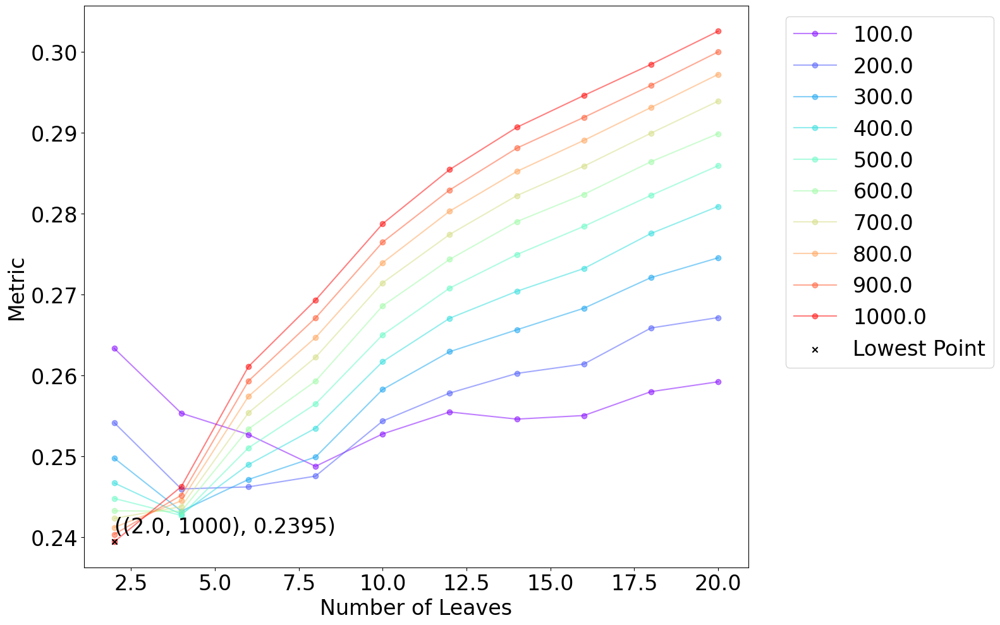

In [ ]:
F9=plotesti(param_scores_df2,"param_esti_df2")

**Part 1.3: Feature selection**

In [ ]:
top_k_features9, aggregated_scores9,sorted_indices9=featureop(F9[1],F9[0],train, a9)

Average Train RMSE+MAE: 0.029808624128722698
Average Validation RMSE+MAE: 0.03311335925784399


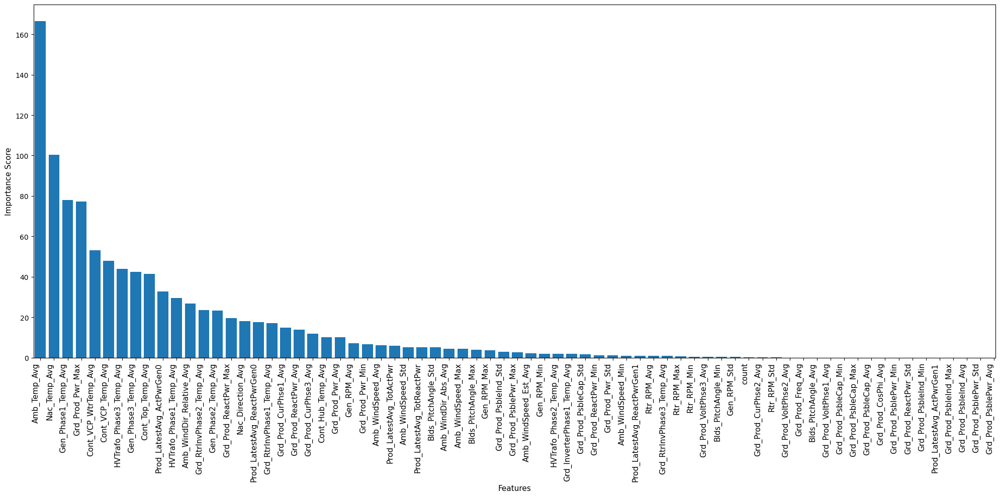

In [ ]:
plothis(top_k_features9, aggregated_scores9,sorted_indices9,"feature9")

In [ ]:
df3=df2[top_k_features9] #arrange columns by ranking
df3=mean_norm(df3)
df3

,Amb_Temp_Avg,Nac_Temp_Avg,Gen_Phase1_Temp_Avg,Grd_Prod_Pwr_Max,Cont_VCP_WtrTemp_Avg,Cont_VCP_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Gen_Phase3_Temp_Avg,Cont_Top_Temp_Avg,Prod_LatestAvg_ActPwrGen0,...,Grd_Prod_PsbleCap_Avg,Grd_Prod_CosPhi_Avg,Grd_Prod_PsblePwr_Min,Grd_Prod_ReactPwr_Std,Grd_Prod_PsbleInd_Min,Prod_LatestAvg_ActPwrGen1,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Avg,Grd_Prod_PsblePwr_Std,Grd_Prod_PsblePwr_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.392857,0.307692,0.285714,0.059302,0.518519,0.433333,0.154930,0.318966,0.357143,0.735791,...,0.0796,0.625,0.00000,0.061326,0.4990,0.008548,1.0000,0.9204,0.030829,0.01085
2016-01-01 00:20:00,0.392857,0.346154,0.277778,0.114442,0.555556,0.433333,0.154930,0.301724,0.357143,0.729839,...,0.3140,0.625,0.00000,0.274371,0.0000,0.032485,1.0000,0.6860,0.067773,0.04445
2016-01-01 00:30:00,0.392857,0.307692,0.269841,0.128893,0.555556,0.433333,0.154930,0.301724,0.357143,0.880376,...,0.6540,0.750,0.00000,0.032613,0.0000,0.068943,1.0000,0.3460,0.066276,0.06765
2016-01-01 00:40:00,0.392857,0.307692,0.277778,0.111215,0.592593,0.433333,0.154930,0.301724,0.357143,0.865975,...,0.4961,0.625,0.00000,0.063453,0.0000,0.050715,1.0000,0.5039,0.075137,0.05135
2016-01-01 00:50:00,0.392857,0.307692,0.285714,0.234262,0.555556,0.433333,0.154930,0.310345,0.357143,0.880376,...,0.9960,1.000,0.07295,0.009926,0.0000,0.160802,0.2853,0.0040,0.085871,0.16035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,0.607143,0.423077,0.103175,0.973202,0.444444,0.366667,0.239437,0.112069,0.357143,0.615783,...,0.0595,0.750,0.43010,0.092520,0.0000,0.032934,1.0000,0.9352,0.337494,0.90445
2016-07-18 01:50:00,0.607143,0.461538,0.261905,0.995136,0.666667,0.366667,0.253521,0.215517,0.321429,0.880376,...,0.4942,1.000,0.75770,0.004963,0.0000,0.958123,0.4167,0.2734,0.140664,0.95590
2016-07-18 02:00:00,0.607143,0.423077,0.404762,0.993640,0.777778,0.400000,0.295775,0.344828,0.357143,0.880376,...,0.4178,1.000,0.79255,0.004786,0.0000,0.993893,0.4167,0.3977,0.060160,0.99415


In [ ]:
train2, test2 = train_test_split(df3, test_size=0.4,shuffle=False)

print(len(train2))
print(a1.shape)
train2

17179
(17179,)


,Amb_Temp_Avg,Nac_Temp_Avg,Gen_Phase1_Temp_Avg,Grd_Prod_Pwr_Max,Cont_VCP_WtrTemp_Avg,Cont_VCP_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Gen_Phase3_Temp_Avg,Cont_Top_Temp_Avg,Prod_LatestAvg_ActPwrGen0,...,Grd_Prod_PsbleCap_Avg,Grd_Prod_CosPhi_Avg,Grd_Prod_PsblePwr_Min,Grd_Prod_ReactPwr_Std,Grd_Prod_PsbleInd_Min,Prod_LatestAvg_ActPwrGen1,Grd_Prod_PsbleInd_Max,Grd_Prod_PsbleInd_Avg,Grd_Prod_PsblePwr_Std,Grd_Prod_PsblePwr_Avg
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.392857,0.307692,0.285714,0.059302,0.518519,0.433333,0.154930,0.318966,0.357143,0.735791,...,0.0796,0.625,0.00000,0.061326,0.499,0.008548,1.0000,0.9204,0.030829,0.01085
2016-01-01 00:20:00,0.392857,0.346154,0.277778,0.114442,0.555556,0.433333,0.154930,0.301724,0.357143,0.729839,...,0.3140,0.625,0.00000,0.274371,0.000,0.032485,1.0000,0.6860,0.067773,0.04445
2016-01-01 00:30:00,0.392857,0.307692,0.269841,0.128893,0.555556,0.433333,0.154930,0.301724,0.357143,0.880376,...,0.6540,0.750,0.00000,0.032613,0.000,0.068943,1.0000,0.3460,0.066276,0.06765
2016-01-01 00:40:00,0.392857,0.307692,0.277778,0.111215,0.592593,0.433333,0.154930,0.301724,0.357143,0.865975,...,0.4961,0.625,0.00000,0.063453,0.000,0.050715,1.0000,0.5039,0.075137,0.05135
2016-01-01 00:50:00,0.392857,0.307692,0.285714,0.234262,0.555556,0.433333,0.154930,0.310345,0.357143,0.880376,...,0.9960,1.000,0.07295,0.009926,0.000,0.160802,0.2853,0.0040,0.085871,0.16035
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.357143,0.230769,0.428571,0.708774,0.555556,0.400000,0.211268,0.431034,0.250000,0.880376,...,0.9985,1.000,0.49385,0.010635,0.000,0.609728,0.0000,0.0000,0.118447,0.61050
2016-04-29 08:20:00,0.357143,0.230769,0.420635,0.577027,0.555556,0.433333,0.225352,0.431034,0.250000,0.880376,...,1.0000,1.000,0.25610,0.011698,0.000,0.453686,0.0000,0.0000,0.177858,0.45315
2016-04-29 08:30:00,0.357143,0.230769,0.412698,0.584464,0.555556,0.433333,0.225352,0.422414,0.285714,0.880376,...,1.0000,1.000,0.24635,0.007267,0.000,0.443821,0.0000,0.0000,0.180354,0.44335


In [ ]:
t9,v9 = fselect(top_k_features9, train2, a9, F9[1],F9[0])

Index when value does not change(from 0): 54
Mean_train_score 0.029808624128722698
Mean_validation_score 0.03311335925784399
Metric 0.23945759054433183


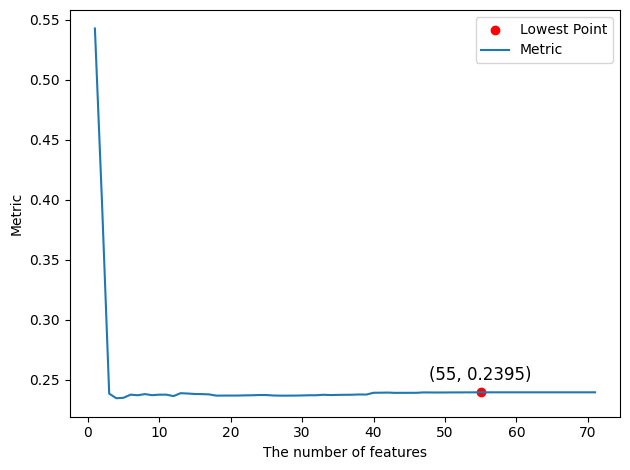

In [ ]:
F9_index=plotfs(t9,v9,"a9_complex_f")

**Part 2.3: Verification**

In [ ]:
#verify the selection of parameter
selected_columns = top_k_features9[:F9_index]
df = pd.DataFrame(train2, columns=selected_columns)
df

,Amb_Temp_Avg,Nac_Temp_Avg,Gen_Phase1_Temp_Avg,Grd_Prod_Pwr_Max,Cont_VCP_WtrTemp_Avg,Cont_VCP_Temp_Avg,HVTrafo_Phase3_Temp_Avg,Gen_Phase3_Temp_Avg,Cont_Top_Temp_Avg,Prod_LatestAvg_ActPwrGen0,...,Rtr_RPM_Avg,Grd_RtrInvPhase3_Temp_Avg,Rtr_RPM_Max,Rtr_RPM_Min,Grd_Prod_VoltPhse3_Avg,Blds_PitchAngle_Min,Gen_RPM_Std,count,Grd_Prod_CurPhse2_Avg,Rtr_RPM_Std
Timestamp,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:10:00,0.392857,0.307692,0.285714,0.059302,0.518519,0.433333,0.154930,0.318966,0.357143,0.735791,...,0.590604,0.347826,0.678788,0.000000,0.342020,0.025806,0.529583,0.000000,0.023317,0.540541
2016-01-01 00:20:00,0.392857,0.346154,0.277778,0.114442,0.555556,0.433333,0.154930,0.301724,0.357143,0.729839,...,0.456376,0.347826,0.745455,0.129252,0.319218,0.011828,0.590572,0.011834,0.053230,0.581081
2016-01-01 00:30:00,0.392857,0.307692,0.269841,0.128893,0.555556,0.433333,0.154930,0.301724,0.357143,0.880376,...,0.744966,0.391304,0.696970,0.727891,0.257329,0.015054,0.020654,0.000000,0.093329,0.013514
2016-01-01 00:40:00,0.392857,0.307692,0.277778,0.111215,0.592593,0.433333,0.154930,0.301724,0.357143,0.865975,...,0.744966,0.391304,0.709091,0.734694,0.254072,0.013978,0.021869,0.000000,0.075369,0.027027
2016-01-01 00:50:00,0.392857,0.307692,0.285714,0.234262,0.555556,0.433333,0.154930,0.310345,0.357143,0.880376,...,0.791946,0.391304,0.787879,0.755102,0.185668,0.010753,0.058681,0.005917,0.173880,0.054054
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-04-29 08:10:00,0.357143,0.230769,0.428571,0.708774,0.555556,0.400000,0.211268,0.431034,0.250000,0.880376,...,0.986577,0.478261,0.903030,0.979592,0.345277,0.009677,0.013729,0.000000,0.614026,0.013514
2016-04-29 08:20:00,0.357143,0.230769,0.420635,0.577027,0.555556,0.433333,0.225352,0.431034,0.250000,0.880376,...,0.966443,0.434783,0.903030,0.870748,0.407166,0.006452,0.051999,0.000000,0.457575,0.054054
2016-04-29 08:30:00,0.357143,0.230769,0.412698,0.584464,0.555556,0.433333,0.225352,0.422414,0.285714,0.880376,...,0.959732,0.434783,0.896970,0.891156,0.429967,0.009677,0.054307,0.005917,0.446211,0.054054


In [ ]:
param_easy=optimizer(df,a9)
print(param_easy)

   param_n_estimators param_num_leaves  mean_train_score  \
0                 100                2          0.037307   
1                 100                4          0.031227   
2                 100                6          0.027912   
3                 100                8          0.025875   
4                 100               10          0.024423   
..                ...              ...               ...   
95               1000               12          0.013262   
96               1000               14          0.012169   
97               1000               16          0.011195   
98               1000               18          0.010342   
99               1000               20          0.009589   

    mean_validation_score  
0                0.041009  
1                0.035712  
2                0.032789  
3                0.031137  
4                0.030526  
..                    ...  
95               0.027298  
96               0.027400  
97               0.027659  

In [ ]:
#plotscore(param_easy,"param_easy")

param_n_estimators           1000
param_num_leaves                2
mean_train_score         0.029809
mean_validation_score    0.033113
Name: 90, dtype: object


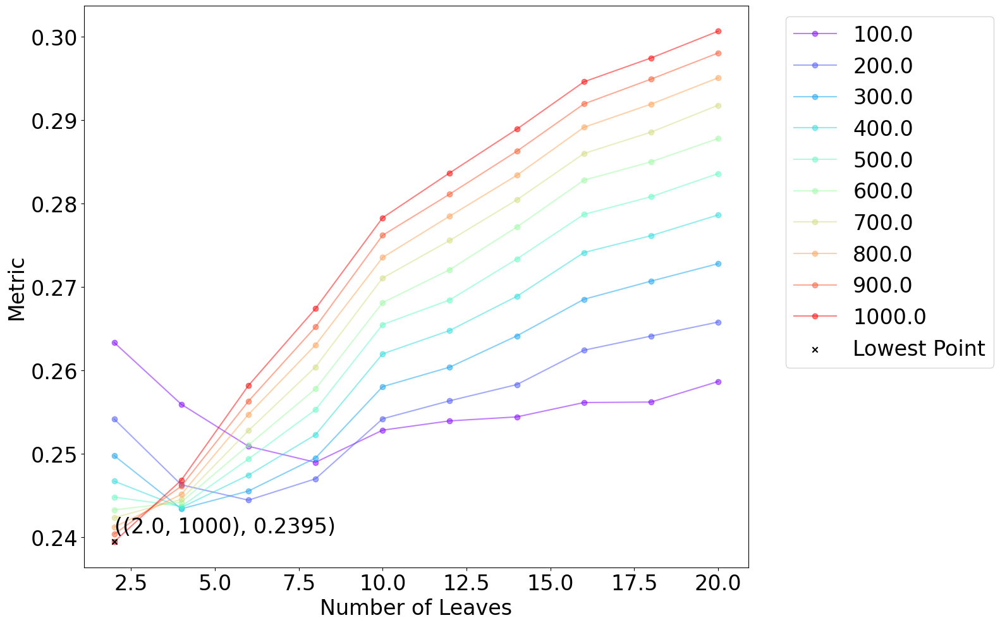

In [ ]:
F92=plotesti(param_easy,"param_easy_esti_df")

# **Part 2: Saving and analysis**

In [ ]:
#final parameters
series_list2 = [F11, F21, F32, F42, F52, F62, F72, F82, F92]
index_values = [1, 2, 3, 4, 5, 6, 7, 8, 9]
dfG1 = pd.DataFrame(series_list2, index=index_values)
dfG1.columns= ["param_n_estimators2", "param_num_leaves2","mean_train_score2","mean_validation_score2"]
dfG1

,param_n_estimators2,param_num_leaves2,mean_train_score2,mean_validation_score2
1,300,2,0.086188,0.093502
2,200,2,0.064266,0.070383
3,100,2,0.088639,0.098659
4,1000,2,0.071663,0.087211
5,200,6,0.034036,0.043673
6,200,4,0.028603,0.031892
7,100,2,0.101919,0.115875
8,200,4,0.041375,0.048432
9,1000,2,0.029809,0.033113


In [ ]:
#paramters in the first grid search
series_list = [F1, F2, F3, F4, F5, F6, F7, F8, F9]
index_values = [1, 2, 3, 4, 5, 6, 7, 8, 9]
element = [F1_index, F2_index, F3_index, F4_index, F5_index, F6_index, F7_index, F8_index, F9_index]
column_names = ['Gear_Oil_Temp_Avg', 'Gear_Bear_Temp_Avg','Gen_Bear_Temp_Avg', 'Hyd_Oil_Temp_Avg', 'Cont_VCP_ChokcoilTemp_Avg',
               'Grd_Busbar_Temp_Avg', 'Gen_Bear2_Temp_Avg', 'Spin_Temp_Avg', 'Gen_SlipRing_Temp_Avg']

names_column = pd.Series(column_names, index=index_values, name='Names')
e_column = pd.Series(element, index=index_values, name='Names')

dfG = pd.DataFrame(series_list, index=index_values)
dfG['Names'] = names_column
dfG['Element'] = e_column
dfG

,param_n_estimators,param_num_leaves,mean_train_score,mean_validation_score,Names,Element
1,300,2,0.086188,0.093502,Gear_Oil_Temp_Avg,37
2,200,2,0.064266,0.070383,Gear_Bear_Temp_Avg,44
3,100,2,0.088639,0.098659,Gen_Bear_Temp_Avg,61
4,1000,2,0.071251,0.087449,Hyd_Oil_Temp_Avg,25
5,200,6,0.034036,0.043668,Cont_VCP_ChokcoilTemp_Avg,67
6,200,4,0.028603,0.031892,Grd_Busbar_Temp_Avg,65
7,100,2,0.101922,0.115889,Gen_Bear2_Temp_Avg,19
8,100,4,0.044805,0.050971,Spin_Temp_Avg,47
9,1000,2,0.029809,0.033113,Gen_SlipRing_Temp_Avg,55


In [ ]:
df_h = pd.concat([dfG1, dfG], axis=1)
df_h.to_csv("df_h.csv")
df_h

#param_n_estimators2	param_num_leaves2	mean_train_score2	mean_test_score2  parameters selected with reduced package

,param_n_estimators2,param_num_leaves2,mean_train_score2,mean_validation_score2,param_n_estimators,param_num_leaves,mean_train_score,mean_validation_score,Names,Element
1,300,2,0.086188,0.093502,300,2,0.086188,0.093502,Gear_Oil_Temp_Avg,37
2,200,2,0.064266,0.070383,200,2,0.064266,0.070383,Gear_Bear_Temp_Avg,44
3,100,2,0.088639,0.098659,100,2,0.088639,0.098659,Gen_Bear_Temp_Avg,61
4,1000,2,0.071663,0.087211,1000,2,0.071251,0.087449,Hyd_Oil_Temp_Avg,25
5,200,6,0.034036,0.043673,200,6,0.034036,0.043668,Cont_VCP_ChokcoilTemp_Avg,67
6,200,4,0.028603,0.031892,200,4,0.028603,0.031892,Grd_Busbar_Temp_Avg,65
7,100,2,0.101919,0.115875,100,2,0.101922,0.115889,Gen_Bear2_Temp_Avg,19
8,200,4,0.041375,0.048432,100,4,0.044805,0.050971,Spin_Temp_Avg,47
9,1000,2,0.029809,0.033113,1000,2,0.029809,0.033113,Gen_SlipRing_Temp_Avg,55


In [ ]:
dfs = []  # List to store the resulting DataFrames

top_k_features_list = [top_k_features, top_k_features2, top_k_features3, top_k_features4, top_k_features5,
                       top_k_features6, top_k_features7, top_k_features8, top_k_features9]
element = [F1_index, F2_index, F3_index, F4_index, F5_index, F6_index, F7_index, F8_index, F9_index]

for i, (top_k_features, element) in enumerate(zip(top_k_features_list, element), start=1):
    df_temp = df2[top_k_features].iloc[:, :element]
    dfs.append(df_temp)
    globals()[f'dff{i}'] = df_temp

In [ ]:
import pickle
# Assuming you have the top_k_features_list defined
# Specify the file path to save the list
file_path = "top_k_features_list.pkl"
# Save the top_k_features_list to the file using pickle
with open(file_path, 'wb') as file:
    pickle.dump(top_k_features_list, file)

In [ ]:
train1, test1 = train_test_split(dff1, test_size=0.4, shuffle=False)
train2, test2 = train_test_split(dff2, test_size=0.4, shuffle=False)
train3, test3 = train_test_split(dff3, test_size=0.4, shuffle=False)
train4, test4 = train_test_split(dff4, test_size=0.4, shuffle=False)
train5, test5 = train_test_split(dff5, test_size=0.4, shuffle=False)
train6, test6 = train_test_split(dff6, test_size=0.4, shuffle=False)
train7, test7 = train_test_split(dff7, test_size=0.4, shuffle=False)
train8, test8 = train_test_split(dff8, test_size=0.4, shuffle=False)
train9, test9 = train_test_split(dff9, test_size=0.4, shuffle=False)
#a1, train1. b1 test1

In [ ]:
regressor1=LGBMRegressor(num_leaves=F11[1],n_estimators=F11[0],random_state=seed)
regressor2=LGBMRegressor(num_leaves=F21[1],n_estimators=F21[0],random_state=seed)
regressor3=LGBMRegressor(num_leaves=F32[1],n_estimators=F32[0],random_state=seed)
regressor4=LGBMRegressor(num_leaves=F42[1],n_estimators=F42[0],random_state=seed)
regressor5=LGBMRegressor(num_leaves=F52[1],n_estimators=F52[0],random_state=seed)
regressor6=LGBMRegressor(num_leaves=F62[1],n_estimators=F62[0],random_state=seed)
regressor7=LGBMRegressor(num_leaves=F72[1],n_estimators=F72[0],random_state=seed)
regressor8=LGBMRegressor(num_leaves=F82[1],n_estimators=F82[0],random_state=seed)
regressor9=LGBMRegressor(num_leaves=F92[1],n_estimators=F92[0],random_state=seed)

In [ ]:
print(F82[0])

200


In [ ]:
regressors = [regressor1, regressor2, regressor3, regressor4, regressor5, regressor6, regressor7, regressor8, regressor9]
train_data = [train1, train2, train3, train4, train5, train6, train7, train8, train9]
test_data = [test1, test2, test3, test4, test5, test6, test7, test8, test9]
actual_values = [a1, a2, a3, a4, a5, a6, a7, a8, a9]
actual_test_values = [b1, b2, b3, b4, b5, b6, b7, b8, b9]
predicted_values = [[] for _ in range(9)]

losses = pd.DataFrame(columns=['Regressor', 'Train Loss', 'Test Loss'])

residuals = {}

for i in range(9):
    regressors[i].fit(train_data[i], actual_values[i])
    predicted_values[i] = regressors[i].predict(test_data[i])
    y_i = regressors[i].predict(train_data[i])

    train_loss = loss(actual_values[i], y_i)
    test_loss = loss(actual_test_values[i], predicted_values[i])

    losses.loc[i] = ['R' + str(i+1), train_loss, test_loss]

    residuals['s' + str(i+1)] = np.reshape(actual_test_values[i], len(actual_test_values[i])) - np.reshape(predicted_values[i], len(predicted_values[i]))

dfre = pd.DataFrame(residuals).dropna()

print(losses)
print(dfre)

  Regressor  Train Loss  Test Loss
0        R1    0.087124   0.125329
1        R2    0.065048   0.074659
2        R3    0.089836   0.113423
3        R4    0.072886   0.190215
4        R5    0.034890   0.082239
5        R6    0.029135   0.086676
6        R7    0.103569   0.139743
7        R8    0.041929   0.108608
8        R9    0.029974   0.115541
             s1        s2        s3        s4        s5        s6        s7  \
0     -0.006327 -0.014472 -0.099340  0.022247 -0.045357  0.004845  0.151072   
1      0.016567  0.000359 -0.099340  0.038950 -0.036928 -0.005102  0.120803   
2      0.038523  0.008932 -0.092154  0.025571 -0.018096  0.022631  0.129122   
3      0.016569  0.017514 -0.126018  0.015790 -0.021495  0.008250  0.122400   
4      0.049355  0.011826 -0.141142 -0.001642 -0.012901  0.012116  0.120907   
...         ...       ...       ...       ...       ...       ...       ...   
11449  0.239543  0.005307 -0.021519  0.119859 -0.107307  0.005199 -0.048222   
11450  0.212140  0

In [ ]:
# Create lists to store top 5 features and importances for each regressor
top5_features_list = []
top5_importances_list = []

# Loop through your regressors and corresponding train DataFrames
for regressor, train_df in zip(regressors, train_data):
    # Get feature importances
    feature_importances = regressor.feature_importances_

        # Normalize the feature importances
    feature_importances = feature_importances / np.sum(feature_importances)

    # Get feature names
    feature_names = train_df.columns.tolist()
    # ... perform additional operations specific to each regressor or train DataFrame if needed

    # Get indices of top 5 features
    top5_indices = np.argsort(feature_importances)[-5:]

    # Get feature names and importances of the top 5 features
    top5_features = [feature_names[i] for i in top5_indices]
    top5_importances = feature_importances[top5_indices]

    # Save top 5 features and importances
    top5_features_list.append(top5_features)
    top5_importances_list.append(top5_importances)

print(len(top5_features_list))
print(len(top5_importances_list))

9
9


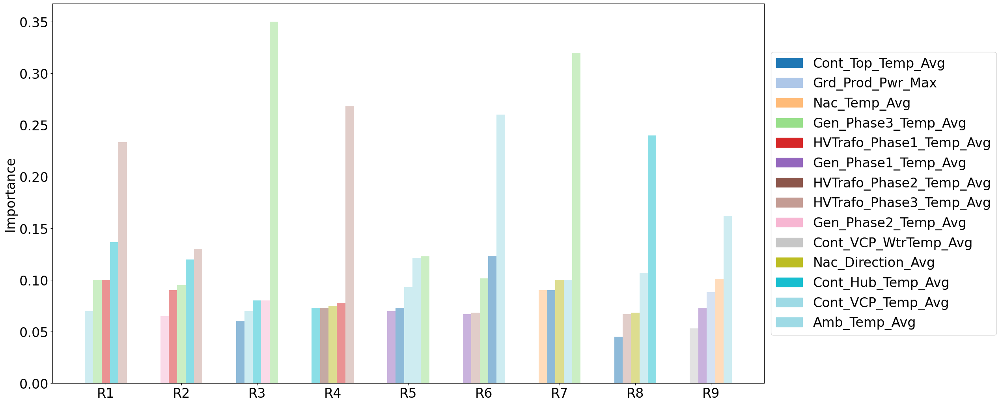

In [ ]:
feature_colors = {}
unique_features = set([feature for sublist in top5_features_list for feature in sublist])
color_map = plt.get_cmap("tab20", 13)  # Assign 13 different colors


# Assign colors to each unique feature
for i, feature in enumerate(unique_features):
    feature_colors[feature] = color_map(i)


# Calculate the total number of regressors
n_regressors = len(regressors)

# Calculate the bar width within each regressor and the gap between regressors
bar_width = 5/ (n_regressors * 5)  # Adjust the width of each bar within a regressor

# Plot feature importances in a single figure
plt.figure(figsize=(20, 20))

# Loop through each regressor
for i, top5_features in enumerate(top5_features_list):
    # Calculate the x positions for each feature within the regressor's columns
    x_positions = np.arange(len(top5_features)) * (bar_width) + i
    for j in range(len(top5_features)):
        feature = top5_features[j]
        feature_color = feature_colors[feature]
        plt.bar(x_positions[j], top5_importances_list[i][j], width=bar_width, alpha=0.5, label=f"Regressor {i+1}", color=feature_color)

plt.ylabel("Importance")
plt.xticks(np.arange(9) + (n_regressors - 1) * (bar_width) / 4, ["R1","R2","R3","R4","R5","R6","R7","R8","R9"], fontsize=24)
plt.legend(fontsize=24)
plt.tight_layout()

# Create custom legend handles with rectangles
legend_elements = [plt.Rectangle((0, 0), 1, 1, color=feature_colors[feature], label=feature) for feature in unique_features]

# Display the legend with custom handles on the right-hand side
plt.legend(handles=legend_elements, loc='center left', bbox_to_anchor=(1, 0.5),fontsize=24)

# Adjust the bottom margin to create space for the legend
plt.subplots_adjust(bottom=0.5)

# Save the figure as a PDF file
plt.savefig("feature_importances.pdf", format="pdf",bbox_inches='tight')

plt.show()

In [ ]:
losses.index=index_values
losses

,Regressor,Train Loss,Test Loss
1,R1,0.087124,0.125329
2,R2,0.065048,0.074659
3,R3,0.089836,0.113423
4,R4,0.072886,0.190215
5,R5,0.034890,0.082239
6,R6,0.029135,0.086676
7,R7,0.103569,0.139743
8,R8,0.041929,0.108608
9,R9,0.029974,0.115541


In [ ]:
df_h = pd.concat([dfG1, dfG,losses], axis=1)

df_h.to_csv("df_h.csv")
df_h

,param_n_estimators2,param_num_leaves2,mean_train_score2,mean_validation_score2,param_n_estimators,param_num_leaves,mean_train_score,mean_validation_score,Names,Element,Regressor,Train Loss,Test Loss
1,300,2,0.086188,0.093502,300,2,0.086188,0.093502,Gear_Oil_Temp_Avg,37,R1,0.087124,0.125329
2,200,2,0.064266,0.070383,200,2,0.064266,0.070383,Gear_Bear_Temp_Avg,44,R2,0.065048,0.074659
3,100,2,0.088639,0.098659,100,2,0.088639,0.098659,Gen_Bear_Temp_Avg,61,R3,0.089836,0.113423
4,1000,2,0.071663,0.087211,1000,2,0.071251,0.087449,Hyd_Oil_Temp_Avg,25,R4,0.072886,0.190215
5,200,6,0.034036,0.043673,200,6,0.034036,0.043668,Cont_VCP_ChokcoilTemp_Avg,67,R5,0.034890,0.082239
6,200,4,0.028603,0.031892,200,4,0.028603,0.031892,Grd_Busbar_Temp_Avg,65,R6,0.029135,0.086676
7,100,2,0.101919,0.115875,100,2,0.101922,0.115889,Gen_Bear2_Temp_Avg,19,R7,0.103569,0.139743
8,200,4,0.041375,0.048432,100,4,0.044805,0.050971,Spin_Temp_Avg,47,R8,0.041929,0.108608
9,1000,2,0.029809,0.033113,1000,2,0.029809,0.033113,Gen_SlipRing_Temp_Avg,55,R9,0.029974,0.115541


In [ ]:
#add time index to residuals
dfr=dfre
index=df2.index[17179:]
print(len(index))
dfr.index=index

11454


In [ ]:
dfr

,s1,s2,s3,s4,s5,s6,s7,s8,s9
Timestamp,,,,,,,,,
2016-04-29 09:00:00,-0.006327,-0.014472,-0.099340,0.022247,-0.045357,0.004845,0.151072,0.011429,-0.026503
2016-04-29 09:10:00,0.016567,0.000359,-0.099340,0.038950,-0.036928,-0.005102,0.120803,0.020782,-0.029266
2016-04-29 09:20:00,0.038523,0.008932,-0.092154,0.025571,-0.018096,0.022631,0.129122,-0.004129,-0.003874
2016-04-29 09:30:00,0.016569,0.017514,-0.126018,0.015790,-0.021495,0.008250,0.122400,0.001778,-0.012055
2016-04-29 09:40:00,0.049355,0.011826,-0.141142,-0.001642,-0.012901,0.012116,0.120907,0.027199,0.002873
...,...,...,...,...,...,...,...,...,...
2016-07-18 01:40:00,0.239543,0.005307,-0.021519,0.119859,-0.107307,0.005199,-0.048222,0.090245,0.039148
2016-07-18 01:50:00,0.212140,0.042753,-0.103916,0.131723,-0.195408,-0.034951,-0.145881,0.053452,-0.003922
2016-07-18 02:00:00,0.135003,-0.034011,-0.195740,0.158767,-0.343958,0.015262,-0.097709,0.069023,0.035015


In [ ]:
dfr.to_csv("/content/resLGBMT.csv")

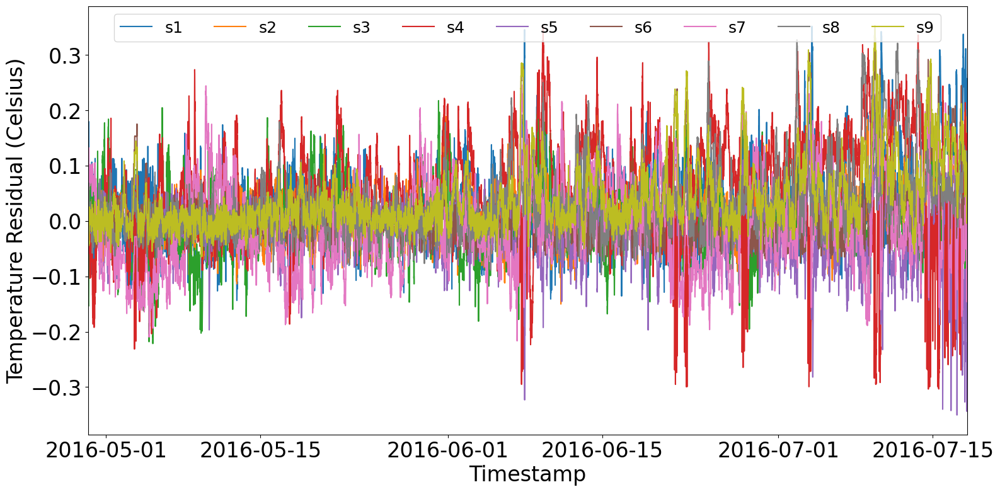

In [ ]:
csfont = {'fontname':'Charis SIL'}
matplotlib.rcParams.update({'font.size': 24})
dfr.index = pd.to_datetime(dfr.index, utc=True)

figsize=(16,9)
dfr.plot(figsize=(18,10))
plt.margins(x=0)
plt.legend(loc="upper center", ncol=len(dfr.columns), fontsize = 18)
plt.xticks(rotation='horizontal', ha='center')
plt.xlabel("Timestamp")
plt.ylabel("Temperature Residual (Celsius)")

plt.savefig('/content/res.pdf',bbox_inches='tight')

In [ ]:
import pickle

for i, regressor in enumerate(regressors):
    filename = f"regressor{i+1}.pkl"
    with open(filename, 'wb') as file:
        pickle.dump(regressor, file)